In [21]:
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image

In [22]:

# Définir le chemin d'accès au dossier du dataset
dataset_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)"

# Explorer les fichiers CSV et afficher des informations détaillées
for csv_file in os.listdir(dataset_dir):
    if csv_file.endswith(".csv"):
        filepath = os.path.join(dataset_dir, csv_file)
        df = pd.read_csv(filepath)
        print(f"Exploration de {csv_file}:")
        print(df.info())
        print(df.describe())
        print()

Exploration de lfw_allnames.csv:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5749 entries, 0 to 5748
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   name    5749 non-null   object
 1   images  5749 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 90.0+ KB
None
            images
count  5749.000000
mean      2.301792
std       9.016410
min       1.000000
25%       1.000000
50%       1.000000
75%       2.000000
max     530.000000

Exploration de matchpairsDevTest.csv:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   name       500 non-null    object
 1   imagenum1  500 non-null    int64 
 2   imagenum2  500 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 11.8+ KB
None
        imagenum1   imagenum2
count  500.000000  500.000000
mean     2.634000    5.178000
std   

In [23]:
# Charger et afficher un échantillon plus large d'images
sample_images_dir = os.path.join(dataset_dir, "lfw-deepfunneled")
sample_images = os.listdir(sample_images_dir)[:20]  # Sélectionner 20 images pour l'échantillon

In [24]:
plt.figure(figsize=(16, 8))
for i, image_name in enumerate(sample_images, 1):
    # Construire le chemin complet de l'image
    image_path = os.path.join(sample_images_dir, image_name)
    # Vérifier si le chemin correspond à un fichier (et non à un répertoire)
    if os.path.isfile(image_path):
        img = Image.open(image_path)
        plt.subplot(4, 5, i)
        plt.imshow(img)
        plt.title(image_name)
        plt.axis('off')
plt.show()

<Figure size 1600x800 with 0 Axes>

In [25]:
# Analyse exploratoire des classes
people_df = pd.read_csv(os.path.join(dataset_dir, "people.csv"))
num_classes = people_df['name'].nunique()
class_distribution = people_df['name'].value_counts()

In [26]:

# Examiner les paires d'images
pairs_files = [f for f in os.listdir(dataset_dir) if f.startswith("matchpairs") or f.startswith("mismatchpairs")]
for pair_file in pairs_files:
    pair_df = pd.read_csv(os.path.join(dataset_dir, pair_file))
    print(f"Exploration de {pair_file}:")
    print(pair_df.info())
    print(pair_df.describe())
    print()


Exploration de matchpairsDevTest.csv:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   name       500 non-null    object
 1   imagenum1  500 non-null    int64 
 2   imagenum2  500 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 11.8+ KB
None
        imagenum1   imagenum2
count  500.000000  500.000000
mean     2.634000    5.178000
std      4.233662    7.419732
min      1.000000    2.000000
25%      1.000000    2.000000
50%      1.000000    3.000000
75%      2.000000    5.000000
max     41.000000  108.000000

Exploration de mismatchpairsDevTest.csv:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   name       500 non-null    object
 1   imagenum1  500 non-null    int64 
 2   name.1     500 non-null    obj

In [27]:
# Trier le DataFrame en fonction du nombre d'images par personne
people_df_sorted = people_df.sort_values(by='images', ascending=False)

# Sélectionner les noms et le nombre d'images des 20 premières personnes avec le plus d'images
top_20_people = people_df_sorted.head(20)

In [28]:
# Afficher le résultat
print(top_20_people)


                           name  images
5355              George_W_Bush   530.0
1811               Colin_Powell   236.0
1129                 Tony_Blair   144.0
3503            Donald_Rumsfeld   121.0
3008          Gerhard_Schroeder   109.0
5193               Ariel_Sharon    77.0
242                 Hugo_Chavez    71.0
4856          Junichiro_Koizumi    60.0
3614              Jean_Chretien    55.0
5440              John_Ashcroft    53.0
822              Jacques_Chirac    52.0
4481            Serena_Williams    52.0
3954             Vladimir_Putin    49.0
3721  Luiz_Inacio_Lula_da_Silva    48.0
3551    Gloria_Macapagal_Arroyo    44.0
3999      Arnold_Schwarzenegger    42.0
1968          Jennifer_Capriati    42.0
1474                 Laura_Bush    41.0
364              Lleyton_Hewitt    41.0
2851           Alejandro_Toledo    39.0


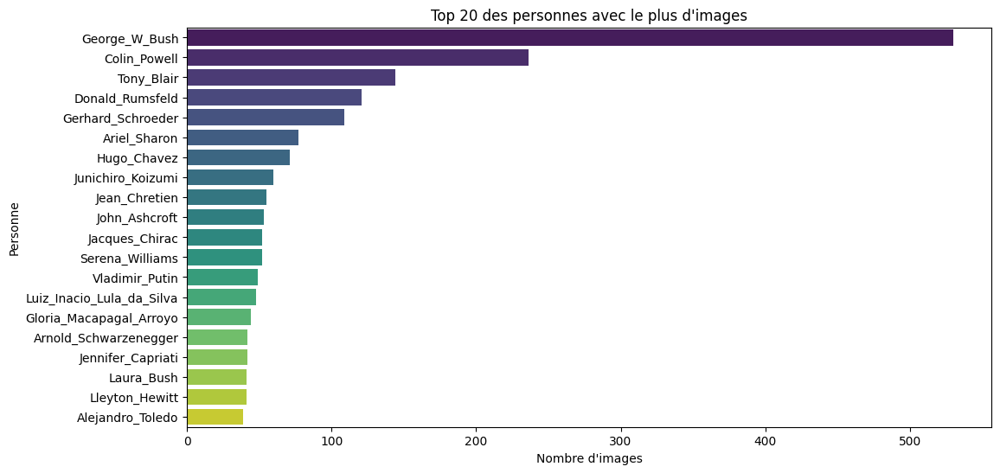

In [29]:
# Créer le graphique
plt.figure(figsize=(12, 6))
sns.barplot(x='images', y='name', data=top_20_people, palette='viridis')
plt.title("Top 20 des personnes avec le plus d'images")
plt.xlabel("Nombre d'images")
plt.ylabel("Personne")
plt.show()



In [30]:
# import os
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg

# # Chemin vers le dossier contenant les images
# images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# # Fonction pour afficher les images avec les noms correspondants en étiquettes
# def display_images_with_labels(df, images_dir, num_images=5):
#     # Sélectionner les noms et le nombre d'images des premières personnes avec le plus d'images
#     top_people = df.head(num_images)
    
#     # Parcourir chaque personne et afficher ses images
#     for index, row in top_people.iterrows():
#         person_name = row['name']
#         person_images = os.listdir(os.path.join(images_dir, person_name))
#         # Afficher jusqu'à 3 images de la personne
#         for i in range(min(3, len(person_images))):
#             img_path = os.path.join(images_dir, person_name, person_images[i])
#             img = mpimg.imread(img_path)
#             plt.figure(figsize=(4, 4))
#             plt.imshow(img)
#             plt.title(person_name)
#             plt.axis('off')
#             plt.show()

# # Appeler la fonction pour afficher les images avec les noms correspondants en étiquettes
# display_images_with_labels(top_20_people, images_dir)


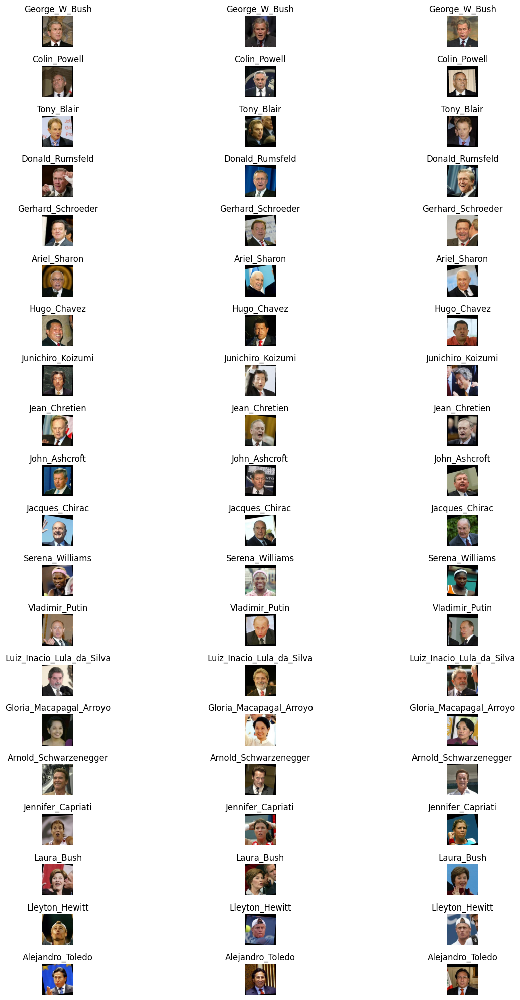

In [31]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Chemin vers le dossier contenant les images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Fonction pour afficher les images avec les noms correspondants en étiquettes
def display_images_with_labels(df, images_dir, num_images=5):
    # Sélectionner les noms et le nombre d'images des premières personnes avec le plus d'images
    top_people = df.head(num_images)
    
    # Parcourir chaque personne et afficher ses images
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 20))
    for i, (_, row) in enumerate(top_people.iterrows()):
        person_name = row['name']
        person_images = os.listdir(os.path.join(images_dir, person_name))
        # Afficher jusqu'à 3 images de la personne
        for j in range(min(3, len(person_images))):
            img_path = os.path.join(images_dir, person_name, person_images[j])
            img = mpimg.imread(img_path)
            axs[i, j].imshow(img)
            axs[i, j].set_title(person_name)
            axs[i, j].axis('off')
    
    # Masquer les axes non utilisés
    for i in range(num_images):
        for j in range(3):
            if i * 3 + j >= len(top_people):
                axs[i, j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Appeler la fonction pour afficher les images avec les noms correspondants en étiquettes
display_images_with_labels(top_20_people, images_dir, num_images=20)


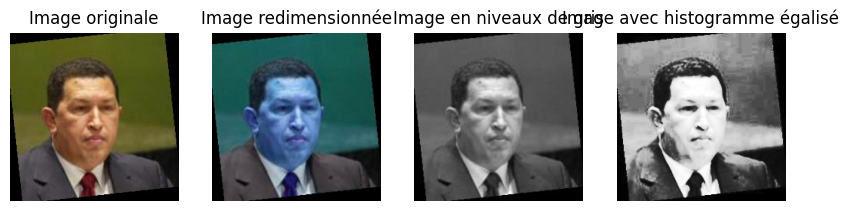

In [32]:
import os
import cv2
import matplotlib.pyplot as plt

# Chemin vers le dossier contenant les images de visages
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Charger une image de visage
image_path = os.path.join(images_dir, "Hugo_Chavez", "Hugo_Chavez_0001.jpg")
image = cv2.imread(image_path)

# Redimensionner l'image
resized_image = cv2.resize(image, (224, 224))

# Conversion en niveaux de gris
gray_image = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)

# Égalisation de l'histogramme
equalized_image = cv2.equalizeHist(gray_image)

# Affichage des images à différentes étapes du prétraitement
plt.figure(figsize=(10, 10))

plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Image originale")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(resized_image, cmap="gray")
plt.title("Image redimensionnée")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(gray_image, cmap="gray")
plt.title("Image en niveaux de gris")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(equalized_image, cmap="gray")
plt.title("Image avec histogramme égalisé")
plt.axis("off")

plt.show()


In [33]:
# import os

# # Chemin du dossier contenant les photos
# photos_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled/Ibrahima_Gabar_Diop"

# # Liste les fichiers du dossier
# photo_names = os.listdir(photos_dir)

# # Parcourir les fichiers
# for i, photo_name in enumerate(photo_names, 1):
#     # Créer le nouveau nom de fichier
#     new_filename = f"Ibrahima_Gabar_Diop_{str(i).zfill(4)}.jpg"
    
#     # Ancien chemin du fichier
#     old_path = os.path.join(photos_dir, photo_name)
    
#     # Nouveau chemin du fichier
#     new_path = os.path.join(photos_dir, new_filename)
    
#     # Renommer le fichier
#     os.rename(old_path, new_path)

#     print(f"Renommage de {photo_name} à {new_filename}")

# print("Terminé!")


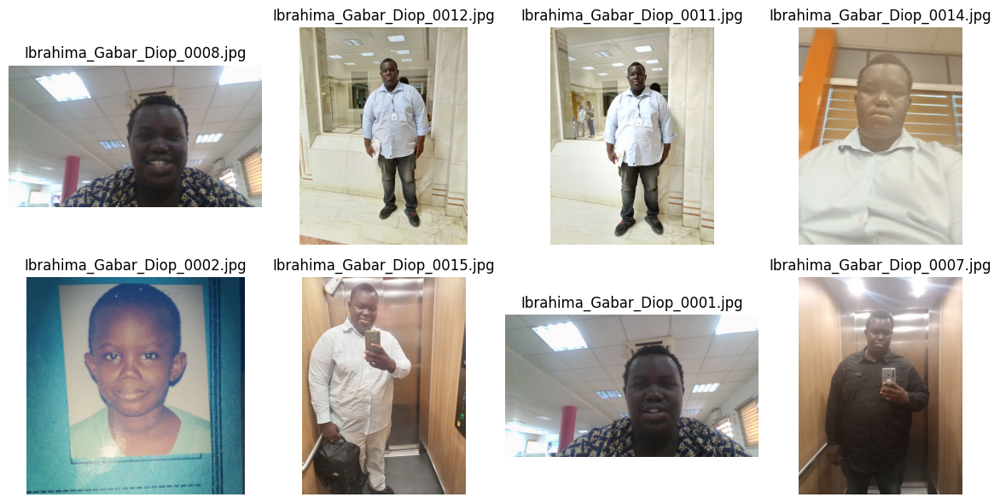

In [34]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Chemin du dossier contenant les photos
photos_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled/Ibrahima_Gabar_Diop"

# Liste les fichiers du dossier
photo_names = os.listdir(photos_dir)[:8]

# Création d'une grille de sous-plots
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(12, 6))

# Parcourir les fichiers et les afficher dans les sous-plots
for i, photo_name in enumerate(photo_names, 1):
    # Charger l'image
    img = Image.open(os.path.join(photos_dir, photo_name))
    
    # Afficher l'image dans le subplot correspondant
    ax = axes[(i-1)//4, (i-1)%4]
    ax.imshow(img)
    ax.set_title(photo_name)
    ax.axis('off')

# Ajuster l'espacement entre les sous-plots
plt.tight_layout()
plt.show()


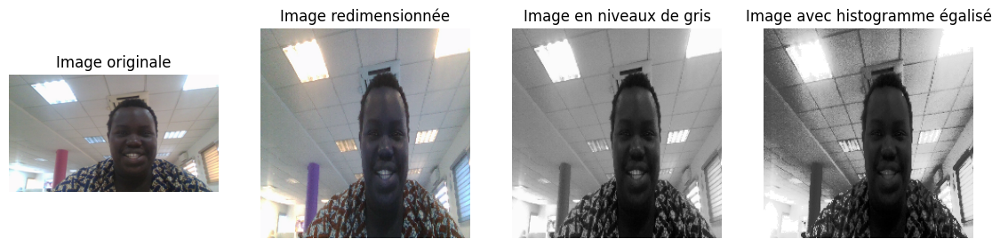

In [35]:
import os
import cv2
import matplotlib.pyplot as plt

# Chemin vers le dossier contenant les images de visages
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Charger une image de visage
image_path = os.path.join(images_dir, "Ibrahima_Gabar_Diop", "Ibrahima_Gabar_Diop_0008.jpg")
image = cv2.imread(image_path)

# Redimensionner l'image
resized_image = cv2.resize(image, (224, 224))

# Conversion en niveaux de gris
gray_image = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)

# Égalisation de l'histogramme
equalized_image = cv2.equalizeHist(gray_image)

# Affichage des images à différentes étapes du prétraitement
plt.figure(figsize=(14, 10))

plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Image originale")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(resized_image, cmap="gray")
plt.title("Image redimensionnée")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(gray_image, cmap="gray")
plt.title("Image en niveaux de gris")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(equalized_image, cmap="gray")
plt.title("Image avec histogramme égalisé")
plt.axis("off")

plt.show()


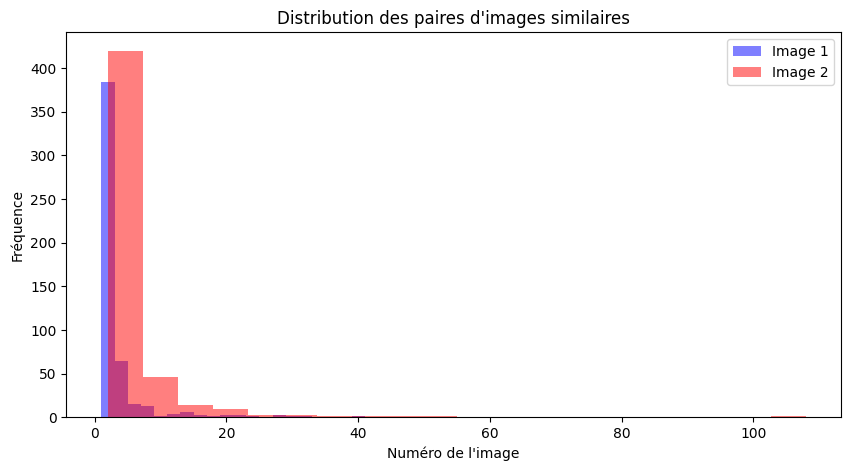

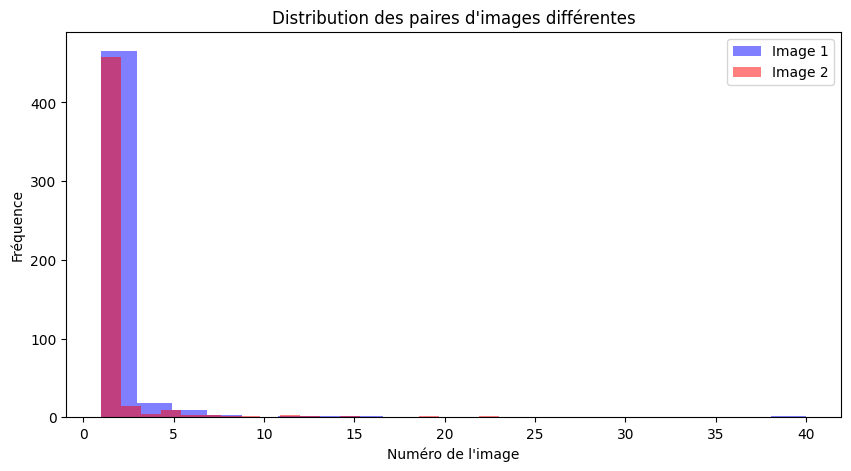

In [36]:
# Importation des bibliothèques nécessaires
import pandas as pd
import matplotlib.pyplot as plt

# Chargement des données des paires d'images similaires et différentes
pair_df_similar = pd.read_csv("/home/gblack98/Images/python/travail_IGD/archive (1)/matchpairsDevTest.csv")
pair_df_different = pd.read_csv("/home/gblack98/Images/python/travail_IGD/archive (1)/mismatchpairsDevTest.csv")

# Visualisation des paires d'images similaires
plt.figure(figsize=(10, 5))
plt.hist(pair_df_similar['imagenum1'], bins=20, alpha=0.5, color='blue', label='Image 1')
plt.hist(pair_df_similar['imagenum2'], bins=20, alpha=0.5, color='red', label='Image 2')
plt.title('Distribution des paires d\'images similaires')
plt.xlabel('Numéro de l\'image')
plt.ylabel('Fréquence')
plt.legend()
plt.show()

# Visualisation des paires d'images différentes
plt.figure(figsize=(10, 5))
plt.hist(pair_df_different['imagenum1'], bins=20, alpha=0.5, color='blue', label='Image 1')
plt.hist(pair_df_different['imagenum2'], bins=20, alpha=0.5, color='red', label='Image 2')
plt.title('Distribution des paires d\'images différentes')
plt.xlabel('Numéro de l\'image')
plt.ylabel('Fréquence')
plt.legend()
plt.show()


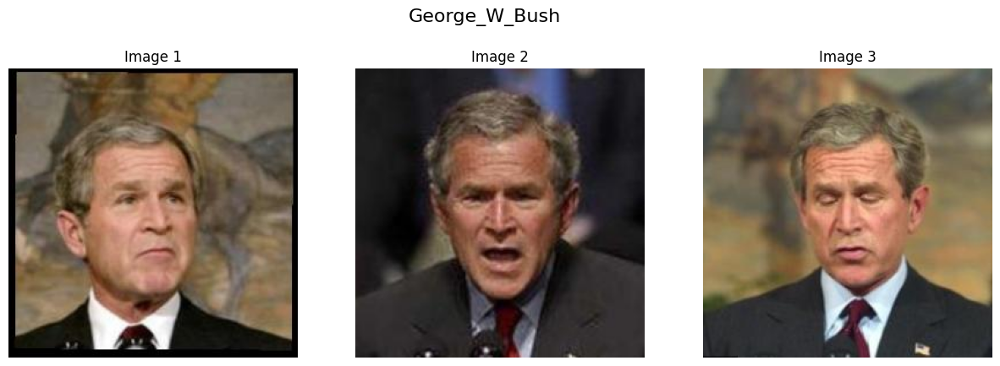

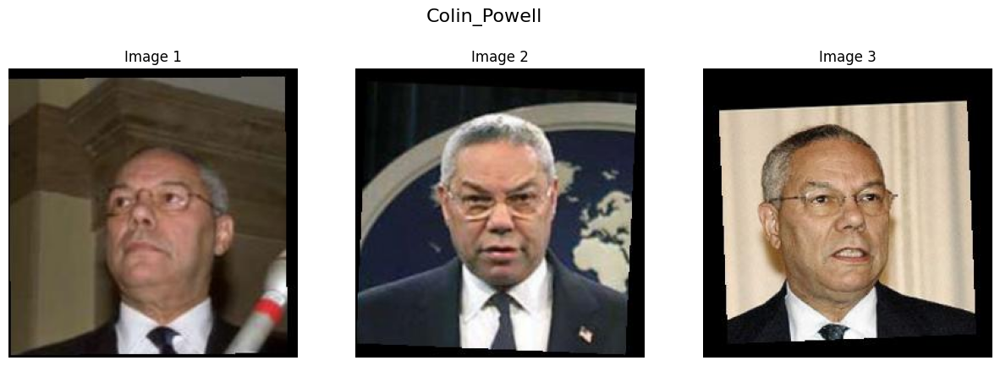

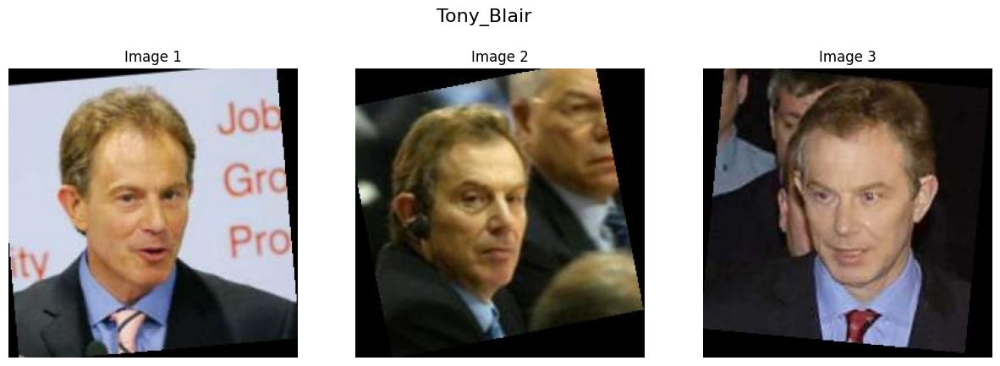

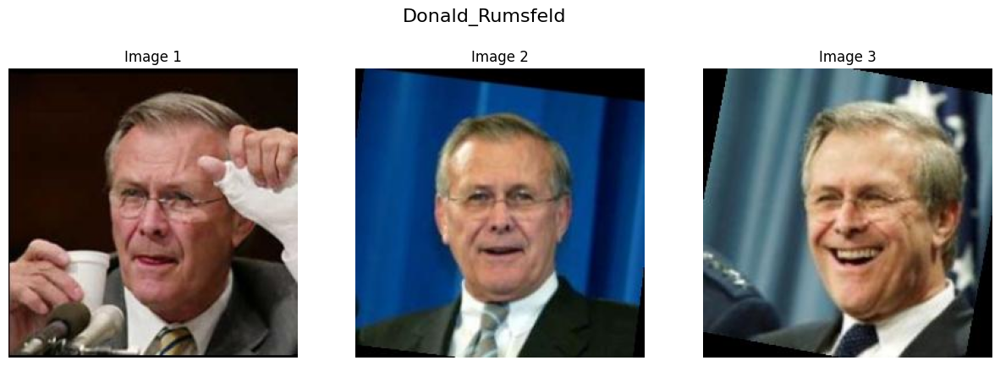

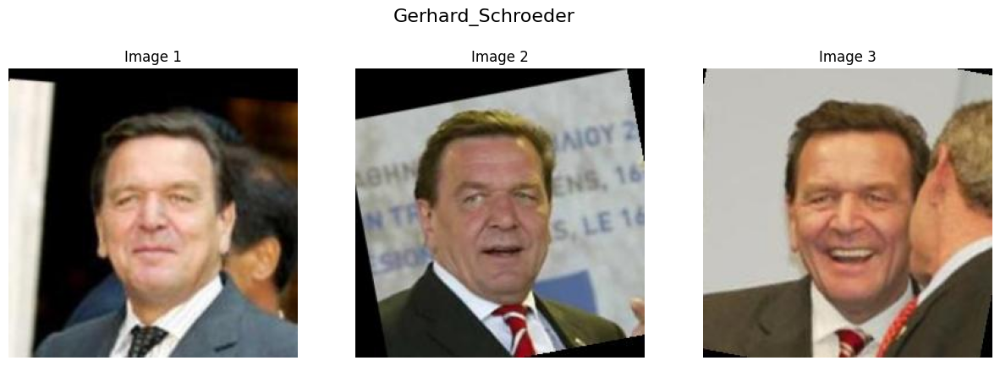

...

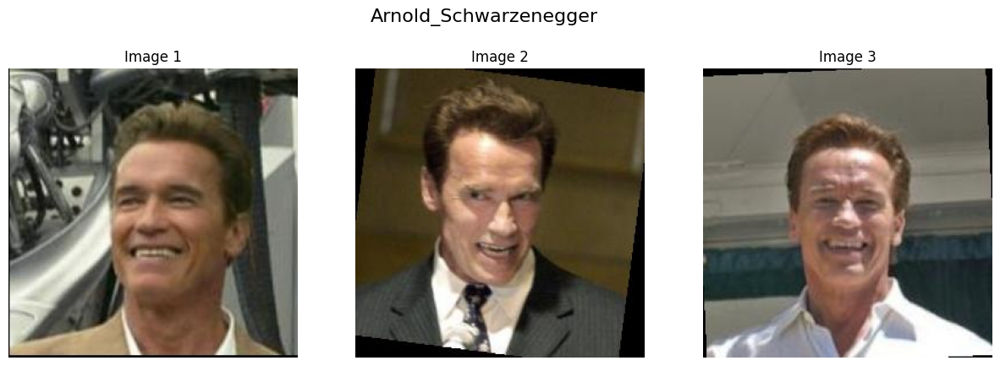

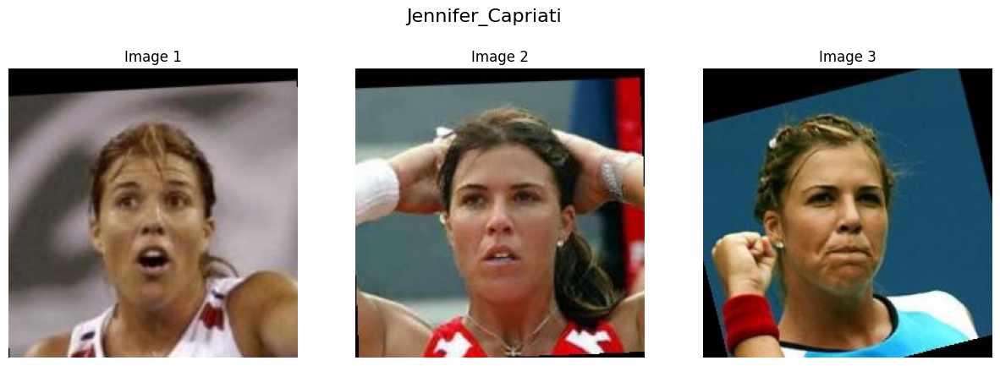

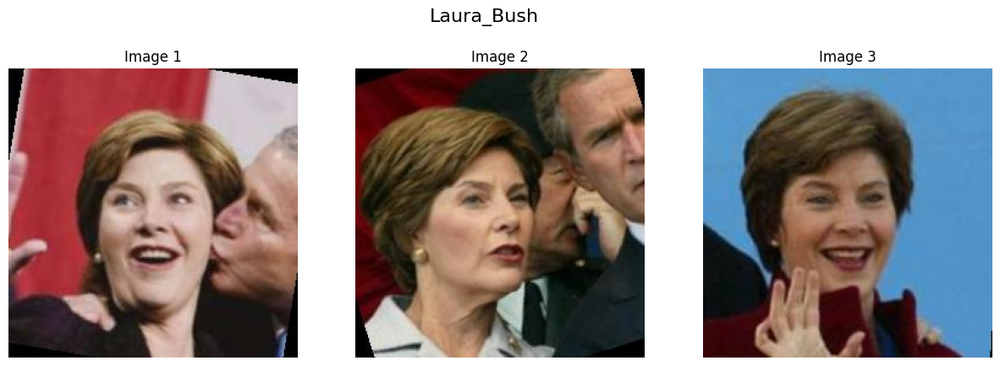

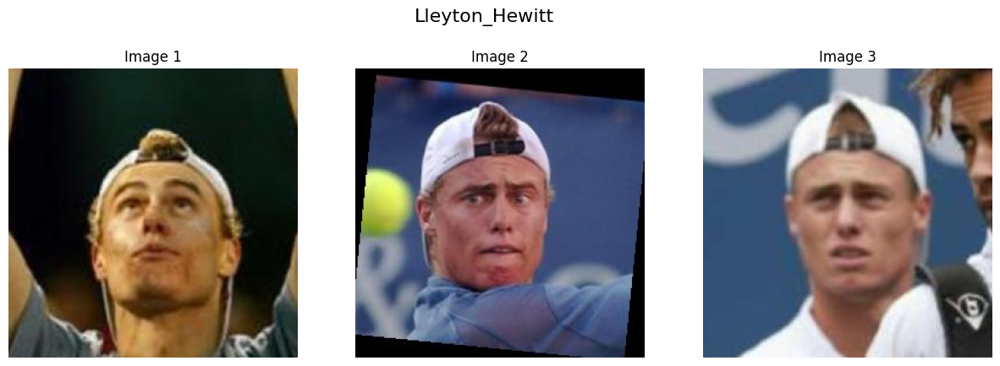

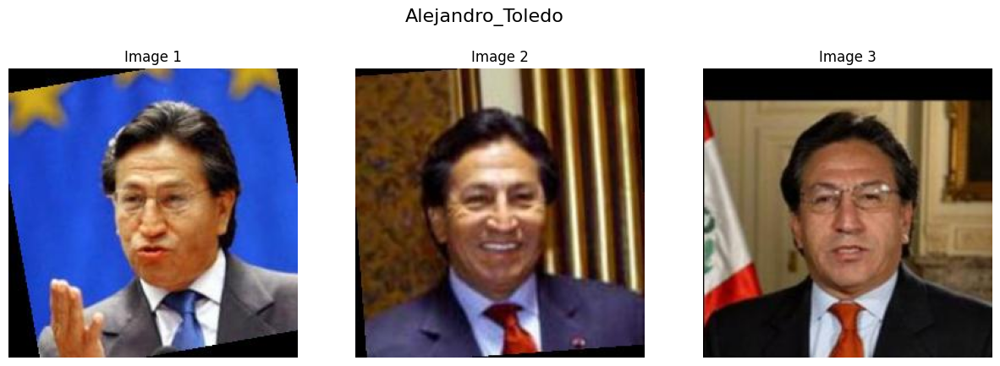

In [37]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd

# Chemin du dossier contenant les images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Charger le DataFrame contenant les informations sur les personnes et le nombre d'images qu'elles ont
people_df = pd.read_csv("/home/gblack98/Images/python/travail_IGD/archive (1)/people.csv")

# Trier le DataFrame en fonction du nombre d'images par personne
people_df_sorted = people_df.sort_values(by='images', ascending=False)

# Sélectionner les noms et le nombre d'images des 20 premières personnes avec le plus d'images
top_20_people = people_df_sorted.head(20)

# Fonction pour afficher les images avec les noms correspondants en étiquettes
def display_images_with_labels(df, images_dir, num_images=3):
    # Parcourir chaque personne et afficher ses images
    for _, row in df.iterrows():
        person_name = row['name']
        person_images_dir = os.path.join(images_dir, person_name)
        person_images = os.listdir(person_images_dir)[:num_images]
        
        # Afficher jusqu'à 3 images de la personne
        fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
        fig.suptitle(person_name, fontsize=16)
        for i, image_name in enumerate(person_images):
            img_path = os.path.join(person_images_dir, image_name)
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].set_title(f"Image {i+1}")
            axes[i].axis('off')
        plt.show()

# Appeler la fonction pour afficher les images avec les noms correspondants en étiquettes
display_images_with_labels(top_20_people, images_dir, num_images=3)


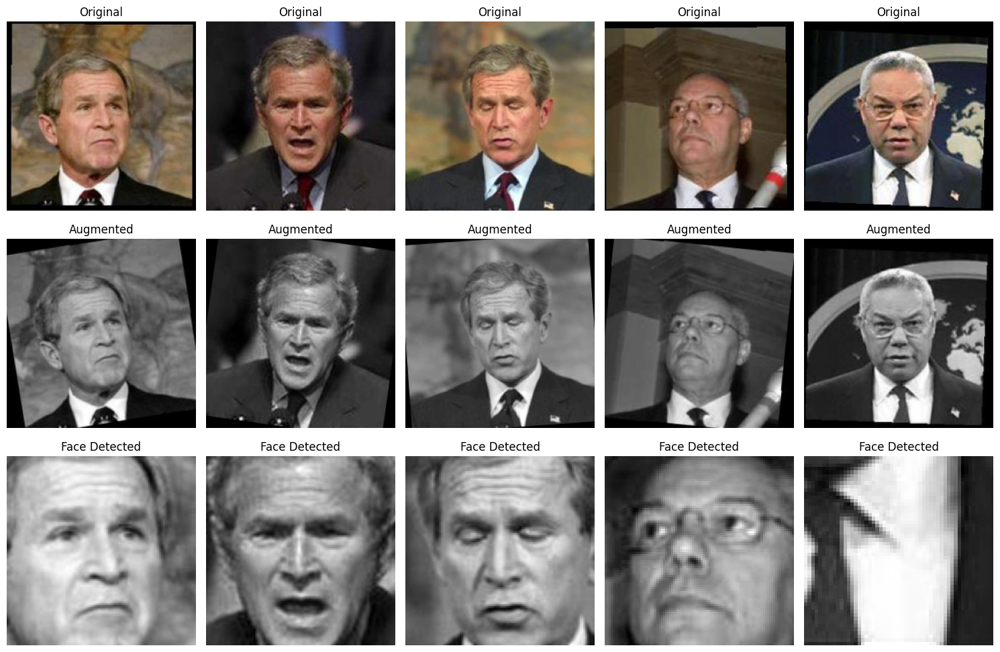

In [38]:
import os
import numpy as np
from PIL import Image
from skimage import transform
import cv2
import matplotlib.pyplot as plt
import random  

# Chemin du dossier contenant les images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Chargement des noms de personnes et de leurs nombres d'images
def load_people_with_images_count():
    people_with_images_count = {}
    for person_name in os.listdir(images_dir):
        person_images_dir = os.path.join(images_dir, person_name)
        num_images = len(os.listdir(person_images_dir))
        people_with_images_count[person_name] = num_images
    # Trier les personnes par nombre d'images (du plus grand au plus petit)
    sorted_people = sorted(people_with_images_count.items(), key=lambda x: x[1], reverse=True)
    return sorted_people[:40]  # Sélectionner les 40 premières personnes

# Charger les chemins d'accès des images pour les 40 premières personnes
def load_top_people_images_paths(num_images_per_person=3):
    top_people_images_paths = []
    top_people = load_people_with_images_count()
    for person_name, _ in top_people:
        person_images_dir = os.path.join(images_dir, person_name)
        person_images = os.listdir(person_images_dir)[:num_images_per_person]
        person_images_paths = [os.path.join(person_images_dir, img) for img in person_images]
        top_people_images_paths.extend(person_images_paths)
    return top_people_images_paths

# Fonction de redimensionnement des images
def resize_images(image_paths, target_size=(224, 224)):
    resized_images = []
    for img_path in image_paths:
        img = Image.open(img_path)
        resized_img = img.resize(target_size, Image.LANCZOS)
        resized_images.append(resized_img)
    return resized_images

# Conversion en niveaux de gris
def convert_to_grayscale(images):
    gray_images = []
    for img in images:
        gray_img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2GRAY)
        gray_images.append(gray_img)
    return np.array(gray_images)

# Normalisation des valeurs de pixel
def normalize_images(images):
    normalized_images = []
    for img in images:
        normalized_img = img / 255.0  # Normalisation des valeurs de pixel entre 0 et 1
        normalized_images.append(normalized_img)
    return np.array(normalized_images)

# Augmentation des données (exemple : rotation aléatoire)
def augment_images(images):
    augmented_images = []
    for img in images:
        angle = random.uniform(-10, 10)
        augmented_img = transform.rotate(img, angle)  # Rotation aléatoire de l'image
        augmented_images.append(augmented_img)
    return np.array(augmented_images)


def remove_noise(images):
    denoised_images = []
    for img in images:
        # Assurez-vous que l'image est au format uint8 (8-bit unsigned integer)
        img_uint8 = np.uint8(img)
        # Appliquer le filtre de débruitage médian
        denoised_img = cv2.medianBlur(img_uint8, 5)
        denoised_images.append(denoised_img)
    return np.array(denoised_images)

# Extraction des caractéristiques (exemple : détection de visage avec OpenCV)
def extract_features(images):
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    features = []
    for img in images:
        # Convertir l'image PIL en tableau numpy
        img_array = np.array(img)
        gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)  # Convertir en niveau de gris
        faces = face_cascade.detectMultiScale(gray_img, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
        for (x, y, w, h) in faces:
            face_img = gray_img[y:y+h, x:x+w]
            features.append(face_img)
    return features

# Chargement des chemins d'accès des images
top_people_images_paths = load_top_people_images_paths()

# Redimensionnement des images
resized_images = resize_images(top_people_images_paths)

# Conversion en niveaux de gris
gray_images = convert_to_grayscale(resized_images)

# Normalisation des valeurs de pixel
normalized_images = normalize_images(gray_images)

# Augmentation des données
augmented_images = augment_images(normalized_images)

# Suppression du bruit
denoised_images = remove_noise(normalized_images)

# Extraction des caractéristiques (détection de visage)
face_features = extract_features(resized_images)

# Affichage des résultats pour quelques images (optionnel)
num_images_to_display = 5
plt.figure(figsize=(15, 10))

# Affichage des images originales (optionnel)
for i in range(num_images_to_display):
    plt.subplot(3, num_images_to_display, i + 1)
    plt.imshow(resized_images[i], cmap='gray')
    plt.title('Original')
    plt.axis('off')

# Affichage des images augmentées (optionnel)
for i in range(num_images_to_display):
    plt.subplot(3, num_images_to_display, i + num_images_to_display + 1)
    plt.imshow(augmented_images[i], cmap='gray')
    plt.title('Augmented')
    plt.axis('off')

# Affichage des caractéristiques extraites (visages) (optionnel)
for i in range(num_images_to_display):
    plt.subplot(3, num_images_to_display, i + 2*num_images_to_display + 1)
    plt.imshow(face_features[i], cmap='gray')
    plt.title('Face Detected')
    plt.axis('off')

plt.tight_layout()
plt.show()




Found 12173 images belonging to 5750 classes.
Found 1075 images belonging to 5750 classes.
Epoch 1/10


/home/gblack98/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


381/381 ━━━━━━━━━━━━━━━━━━━━ 575s 1s/step - accuracy: 0.0337 - loss: 8.2383 - val_accuracy: 0.1367 - val_loss: 6.1597
Epoch 2/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 594s 2s/step - accuracy: 0.0542 - loss: 7.2426 - val_accuracy: 0.1572 - val_loss: 5.1826
Epoch 3/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 610s 2s/step - accuracy: 0.0633 - loss: 6.6394 - val_accuracy: 0.1898 - val_loss: 4.9761
Epoch 4/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 613s 2s/step - accuracy: 0.0851 - loss: 5.9474 - val_accuracy: 0.2149 - val_loss: 4.5109
Epoch 5/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 610s 2s/step - accuracy: 0.1206 - loss: 5.1471 - val_accuracy: 0.2298 - val_loss: 4.5513
Epoch 6/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 612s 2s/step - accuracy: 0.1852 - loss: 4.1507 - val_accuracy: 0.2037 - val_loss: 4.8029
Epoch 7/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 608s 2s/step - accuracy: 0.3083 - loss: 3.1888 - val_accuracy: 0.1981 - val_loss: 5.1801
Epoch 8/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 614s 2s/step - accuracy: 0.4709 - loss: 2.2988 - val_accuracy: 0.199

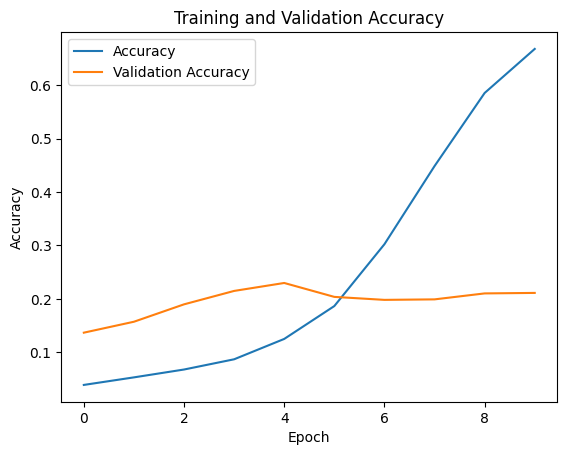

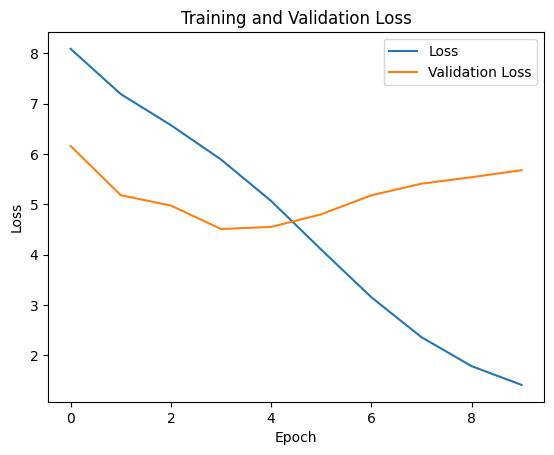

In [41]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

# Chemin du dossier contenant les images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Création d'un générateur d'images pour charger et prétraiter les données
datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)

# Chargement des données depuis le répertoire
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

# Chargement du modèle ResNet50 pré-entraîné sans les couches fully-connected
base_model = ResNet50(weights='imagenet', include_top=False)

# Création d'un nouveau modèle en ajoutant des couches fully-connected au-dessus du modèle ResNet50
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(1024, activation='relu'),  # Modifier le nombre de neurones en fonction de votre besoin
    Dense(5750, activation='softmax')  # Nombre de classes dans votre dataset
])

# Geler les poids du modèle de base (ResNet50) pour empêcher l'entraînement
base_model.trainable = False

# Compilation du modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(train_generator, validation_data=validation_generator, epochs=10)

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


2024-04-11 13:14:18.564819: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-11 13:14:18.754871: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-11 13:14:19.547328: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Found 6742 images belonging to 1000 classes.
Found 1075 images belonging to 1000 classes.
Epoch 1/10


/home/gblack98/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


211/211 ━━━━━━━━━━━━━━━━━━━━ 328s 2s/step - accuracy: 0.0654 - loss: 6.4530 - val_accuracy: 0.1535 - val_loss: 4.8328
Epoch 2/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 327s 2s/step - accuracy: 0.1134 - loss: 5.2723 - val_accuracy: 0.2242 - val_loss: 4.3195
Epoch 3/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 321s 2s/step - accuracy: 0.1861 - loss: 4.3577 - val_accuracy: 0.2577 - val_loss: 3.9421
Epoch 4/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 331s 2s/step - accuracy: 0.2939 - loss: 3.3413 - val_accuracy: 0.2828 - val_loss: 3.8325
Epoch 5/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 351s 2s/step - accuracy: 0.4549 - loss: 2.4030 - val_accuracy: 0.2716 - val_loss: 3.8967
Epoch 6/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 344s 2s/step - accuracy: 0.5822 - loss: 1.7913 - val_accuracy: 0.3079 - val_loss: 3.8351
Epoch 7/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 348s 2s/step - accuracy: 0.6897 - loss: 1.2921 - val_accuracy: 0.3135 - val_loss: 3.8698
Epoch 8/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 341s 2s/step - accuracy: 0.7815 - loss: 0.9465 - val_accuracy: 0.321

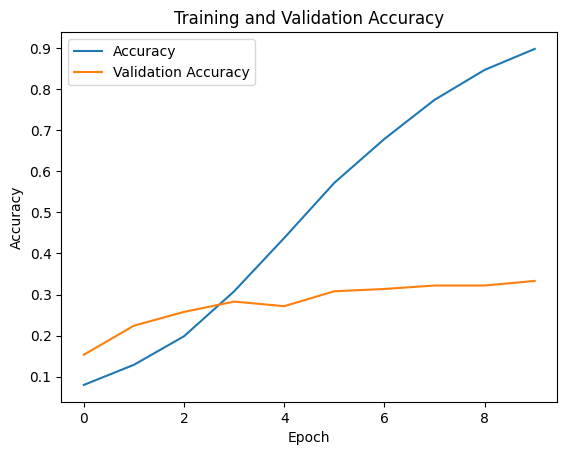

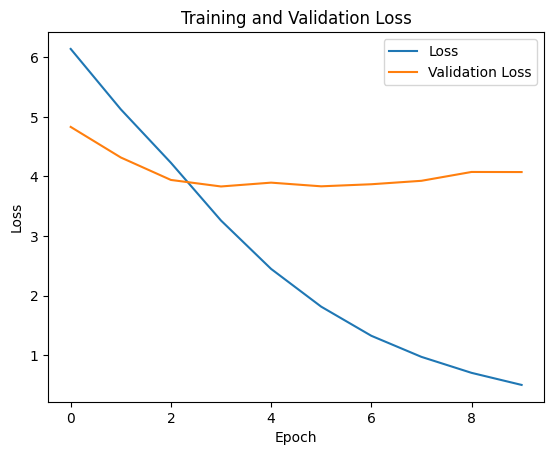

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

# Chemin du dossier contenant les images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Sélection des 1000 premières classes avec le plus grand nombre d'images
top_1000_people = sorted(os.listdir(images_dir), key=lambda x: len(os.listdir(os.path.join(images_dir, x))), reverse=True)[:1000]

# Création d'un générateur d'images pour charger et prétraiter les données
datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)

# Chargement des données depuis le répertoire pour les 1000 premières classes
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training',
    classes=top_1000_people
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    classes=top_1000_people
)

# Chargement du modèle ResNet50 pré-entraîné sans les couches fully-connected
base_model = ResNet50(weights='imagenet', include_top=False)

# Création d'un nouveau modèle en ajoutant des couches fully-connected au-dessus du modèle ResNet50
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(1024, activation='relu'),
    Dense(1000, activation='softmax')  # Nombre de classes sélectionnées
])

# Geler les poids du modèle de base (ResNet50) pour empêcher l'entraînement
base_model.trainable = False

# Compilation du modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(train_generator, validation_data=validation_generator, epochs=10)

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


In [3]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1000)           │     1,025,000 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,957,242 (125.72 MB)

 Trainable params: 3,123,176 (11.91 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

 Optimizer params: 6,246,354 (23.83 MB)

Found 6742 images belonging to 1000 classes.
Found 1075 images belonging to 1000 classes.
Epoch 1/20


/home/gblack98/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


211/211 ━━━━━━━━━━━━━━━━━━━━ 335s 2s/step - accuracy: 0.0632 - loss: 6.4009 - val_accuracy: 0.1442 - val_loss: 5.1650
Epoch 2/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 349s 2s/step - accuracy: 0.1004 - loss: 5.6127 - val_accuracy: 0.1823 - val_loss: 4.5190
Epoch 3/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 351s 2s/step - accuracy: 0.1225 - loss: 5.1478 - val_accuracy: 0.2102 - val_loss: 4.2351
Epoch 4/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 355s 2s/step - accuracy: 0.1485 - loss: 4.7337 - val_accuracy: 0.2223 - val_loss: 4.0496
Epoch 5/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 355s 2s/step - accuracy: 0.1635 - loss: 4.4589 - val_accuracy: 0.2465 - val_loss: 3.8531
Epoch 6/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 367s 2s/step - accuracy: 0.1808 - loss: 4.2488 - val_accuracy: 0.2651 - val_loss: 3.7693
Epoch 7/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 369s 2s/step - accuracy: 0.1903 - loss: 4.0348 - val_accuracy: 0.2791 - val_loss: 3.6482
Epoch 8/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 367s 2s/step - accuracy: 0.2109 - loss: 3.8312 - val_accuracy: 0.274

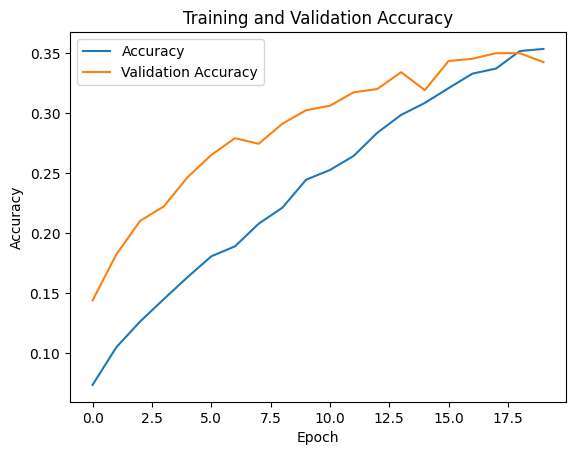

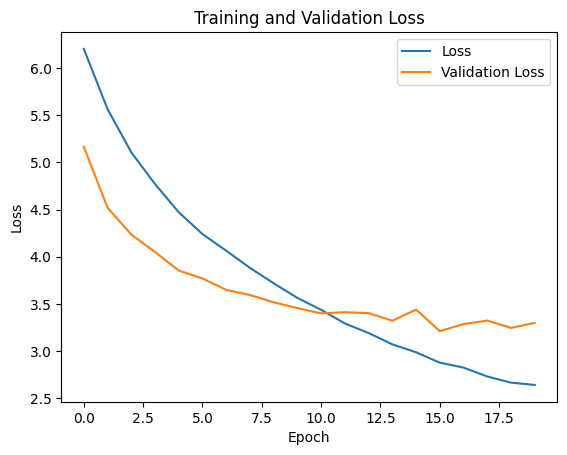

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense

# Chemin du dossier contenant les images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Sélection des 1000 premières classes avec le plus grand nombre d'images
top_1000_people = sorted(os.listdir(images_dir), key=lambda x: len(os.listdir(os.path.join(images_dir, x))), reverse=True)[:1000]

# Création d'un générateur d'images pour charger et prétraiter les données
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Chargement des données depuis le répertoire pour les 1000 premières classes
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training',
    classes=top_1000_people
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    classes=top_1000_people
)

# Chargement du modèle ResNet50 pré-entraîné sans les couches fully-connected
base_model = ResNet50(weights='imagenet', include_top=False)

# Ajout de couches de convolution
x = base_model.output
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)

# Ajout de couches de convolution supplémentaires
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)

# Ajout d'une couche de mise en commun globale
x = GlobalAveragePooling2D()(x)

# Ajout de couches fully-connected
x = Dense(1024, activation='relu')(x)

# Couche de sortie avec softmax
predictions = Dense(len(top_1000_people), activation='softmax')(x)

# Définition du modèle
model = Model(inputs=base_model.input, outputs=predictions)

# Geler les poids du modèle de base (ResNet50) pour empêcher l'entraînement
for layer in base_model.layers:
    layer.trainable = False

# Compilation du modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(train_generator, validation_data=validation_generator, epochs=20)

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


In [6]:
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, None,      │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, None,      │      9,472 │ conv1_pad[0][0]   │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, None,      │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, None,      │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, None,      │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, None,      │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, None,      │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, None,      │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, None,      │          0 │ conv2_block1_1_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, None,      │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, None,      │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, None,      │          0 │ conv2_block1_2_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, None,      │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, None,      │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, None,      │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, None,      │      1,024 │ conv2_block1_3_c

 Total params: 30,819,706 (117.57 MB)

 Trainable params: 2,410,664 (9.20 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

 Optimizer params: 4,821,330 (18.39 MB)

Found 6742 images belonging to 1000 classes.
Found 1075 images belonging to 1000 classes.
17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Epoch 1/20


/home/gblack98/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


211/211 ━━━━━━━━━━━━━━━━━━━━ 121s 556ms/step - accuracy: 0.0635 - loss: 6.5457 - val_accuracy: 0.1033 - val_loss: 5.5123
Epoch 2/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 121s 567ms/step - accuracy: 0.0731 - loss: 6.0860 - val_accuracy: 0.1237 - val_loss: 5.2149
Epoch 3/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 123s 575ms/step - accuracy: 0.0780 - loss: 5.8506 - val_accuracy: 0.1284 - val_loss: 5.0661
Epoch 4/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 124s 575ms/step - accuracy: 0.0932 - loss: 5.6153 - val_accuracy: 0.1460 - val_loss: 4.9107
Epoch 5/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 126s 586ms/step - accuracy: 0.0953 - loss: 5.4001 - val_accuracy: 0.1498 - val_loss: 4.8558
Epoch 6/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 125s 585ms/step - accuracy: 0.0994 - loss: 5.2940 - val_accuracy: 0.1637 - val_loss: 4.7674
Epoch 7/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 126s 588ms/step - accuracy: 0.1100 - loss: 5.0919 - val_accuracy: 0.1423 - val_loss: 4.6836
Epoch 8/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 123s 573ms/step - accuracy: 0.1058 - loss: 5.03

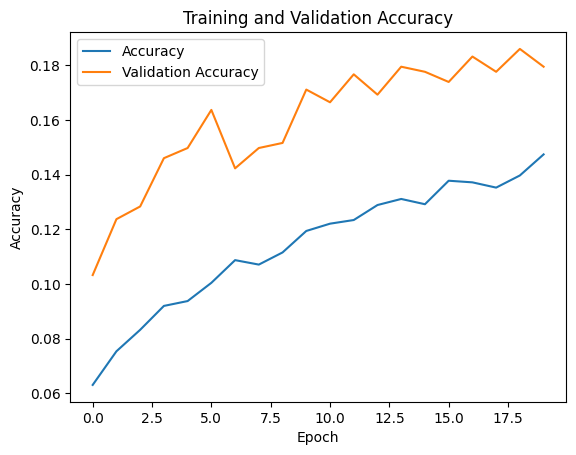

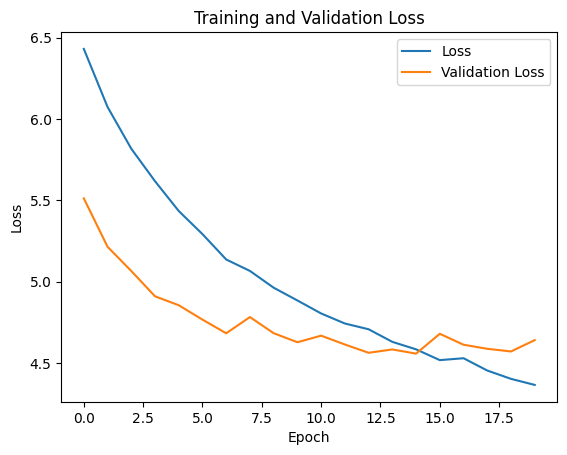

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense

# Chemin du dossier contenant les images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Sélection des 1000 premières classes avec le plus grand nombre d'images
top_1000_people = sorted(os.listdir(images_dir), key=lambda x: len(os.listdir(os.path.join(images_dir, x))), reverse=True)[:1000]

# Création d'un générateur d'images pour charger et prétraiter les données
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Chargement des données depuis le répertoire pour les 1000 premières classes
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training',
    classes=top_1000_people
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    classes=top_1000_people
)

# Chargement du modèle ResNet50 pré-entraîné sans les couches fully-connected
base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Ajout de couches de convolution
x = base_model.output
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)

# Ajout de couches de convolution supplémentaires
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)

# Ajout d'une couche de mise en commun globale
x = GlobalAveragePooling2D()(x)

# Ajout de couches fully-connected
x = Dense(1024, activation='relu')(x)

# Couche de sortie avec softmax
predictions = Dense(len(top_1000_people), activation='softmax')(x)

# Définition du modèle
model = Model(inputs=base_model.input, outputs=predictions)

# Geler les poids du modèle de base (ResNet50) pour empêcher l'entraînement
for layer in base_model.layers:
    layer.trainable = False

# Compilation du modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(train_generator, validation_data=validation_generator, epochs=20)

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


Found 6742 images belonging to 1000 classes.
Found 1075 images belonging to 1000 classes.
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 13s 0us/step
Epoch 1/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 194s 892ms/step - accuracy: 0.0380 - loss: 8.6399 - val_accuracy: 0.0986 - val_loss: 5.7486
Epoch 2/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 195s 914ms/step - accuracy: 0.0671 - loss: 6.3087 - val_accuracy: 0.0986 - val_loss: 5.7065
Epoch 3/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 196s 920ms/step - accuracy: 0.0648 - loss: 6.2912 - val_accuracy: 0.0986 - val_loss: 5.6398
Epoch 4/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 196s 923ms/step - accuracy: 0.0653 - loss: 6.2739 - val_accuracy: 0.0986 - val_loss: 5.6755
Epoch 5/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 206s 965ms/step - accuracy: 0.0615 - loss: 6.2750 - val_accuracy: 0.0986 - val_loss: 5.7105
Epoch 6/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 201s 945ms/step - accuracy: 0.0679 - loss: 6.2718 - val_accuracy: 0.0986 - val_loss: 5.6891
Epoch 7/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 201s 943ms/step - accuracy

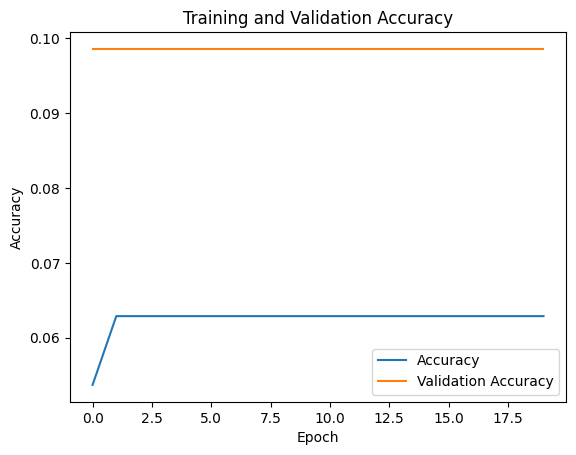

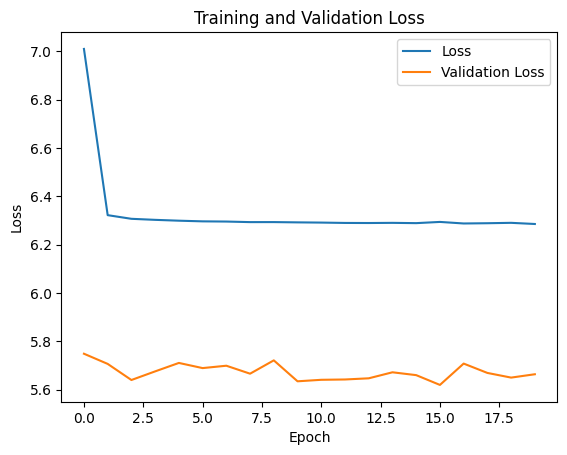

In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense

# Chemin du dossier contenant les images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Sélection des 1000 premières classes avec le plus grand nombre d'images
top_1000_people = sorted(os.listdir(images_dir), key=lambda x: len(os.listdir(os.path.join(images_dir, x))), reverse=True)[:1000]

# Création d'un générateur d'images pour charger et prétraiter les données
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Chargement des données depuis le répertoire pour les 1000 premières classes
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training',
    classes=top_1000_people
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    classes=top_1000_people
)

# Chargement du modèle ResNet50 pré-entraîné sans les couches fully-connected
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Ajout de couches de convolution
x = base_model.output
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)

# Ajout de couches de convolution supplémentaires
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)

# Ajout d'une couche de mise en commun globale
x = GlobalAveragePooling2D()(x)

# Ajout de couches fully-connected
x = Dense(1024, activation='relu')(x)

# Couche de sortie avec softmax
predictions = Dense(len(top_1000_people), activation='softmax')(x)

# Définition du modèle
model = Model(inputs=base_model.input, outputs=predictions)

# Geler les poids du modèle de base (ResNet50) pour empêcher l'entraînement
for layer in base_model.layers:
    layer.trainable = False

# Compilation du modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(train_generator, validation_data=validation_generator, epochs=20)

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


Found 6742 images belonging to 1000 classes.
Found 1075 images belonging to 1000 classes.
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 284s 10us/step
Epoch 1/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 387s 2s/step - accuracy: 0.0383 - loss: 7.6692 - val_accuracy: 0.0958 - val_loss: 5.7056
Epoch 2/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 389s 2s/step - accuracy: 0.0551 - loss: 6.2805 - val_accuracy: 0.1014 - val_loss: 5.5412
Epoch 3/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 399s 2s/step - accuracy: 0.0695 - loss: 6.0591 - val_accuracy: 0.0986 - val_loss: 5.4352
Epoch 4/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 406s 2s/step - accuracy: 0.0691 - loss: 5.9314 - val_accuracy: 0.0940 - val_loss: 5.4843
Epoch 5/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 407s 2s/step - accuracy: 0.0725 - loss: 5.8247 - val_accuracy: 0.1088 - val_loss: 5.4423
Epoch 6/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 384s 2s/step - accuracy: 0.0692 - loss: 5.7554 - val_accuracy: 0.1153 - val_loss: 5.4041
Epoch 7/20
211/211 ━━━━━━━━━━━━━━━━━━━━ 383s 2s/step - accuracy: 0.0699 - loss: 5.

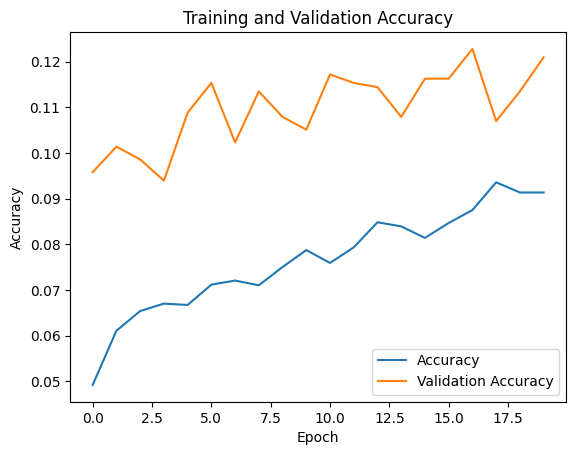

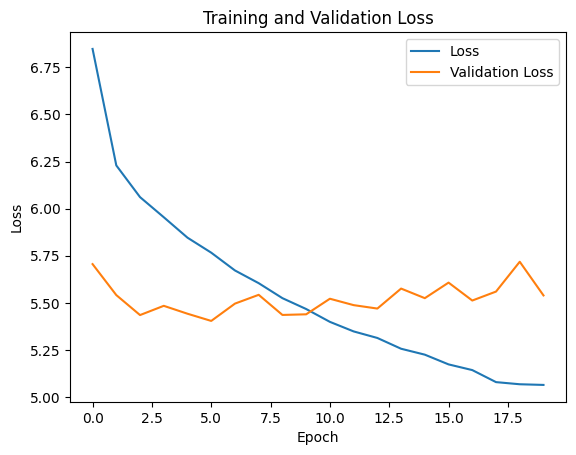

In [19]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Chemin du dossier contenant les images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Sélection des 1000 premières classes avec le plus grand nombre d'images
top_1000_people = sorted(os.listdir(images_dir), key=lambda x: len(os.listdir(os.path.join(images_dir, x))), reverse=True)[:1000]

# Création d'un générateur d'images pour charger et prétraiter les données
datagen = ImageDataGenerator(
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Chargement des données depuis le répertoire pour les 1000 premières classes
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training',
    classes=top_1000_people
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    classes=top_1000_people
)

# Charger le modèle DenseNet121 pré-entraîné sans les couches fully-connected
base_model = DenseNet121(weights='imagenet', include_top=False)

# Ajouter des couches fully-connected au-dessus du modèle DenseNet121
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(len(top_1000_people), activation='softmax')(x)

# Définir le modèle complet
model = Model(inputs=base_model.input, outputs=predictions)

# Geler les poids du modèle de base (DenseNet121) pour empêcher l'entraînement
for layer in base_model.layers:
    layer.trainable = False

# Compilation du modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(train_generator, validation_data=validation_generator, epochs=20)




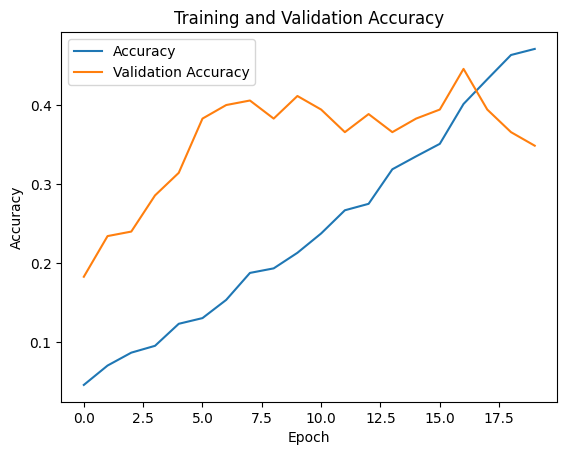

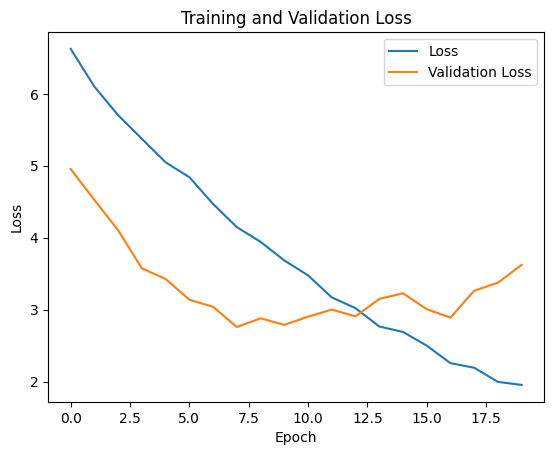

In [3]:
import matplotlib.pyplot as plt

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [1]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense

# Define paths and hyperparameters
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"
top_n_classes = 1000  # Adjust depending on the number of classes
target_size = (224, 224)
batch_size = 32
epochs = 20

# Data augmentation for training data
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Generators for training and validation data
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    classes=os.listdir(images_dir)[:top_n_classes]  # Select top N classes
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    classes=os.listdir(images_dir)[:top_n_classes]
)

# Load pre-trained ResNet50 and freeze base layers
base_model = ResNet50(weights='imagenet', include_top=False)
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers for fine-tuning
x = base_model.output
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(top_n_classes, activation='softmax')(x)

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model with Adam optimizer and categorical crossentropy loss
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_generator, validation_data=validation_generator, epochs=epochs)

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

2024-04-15 17:17:49.888965: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-15 17:17:50.061998: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-15 17:17:50.816413: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Found 2083 images belonging to 1000 classes.
Found 175 images belonging to 1000 classes.
Epoch 1/20


/home/gblack98/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


66/66 ━━━━━━━━━━━━━━━━━━━━ 110s 2s/step - accuracy: 0.0336 - loss: 6.7540 - val_accuracy: 0.1829 - val_loss: 4.9530
Epoch 2/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.0718 - loss: 6.1078 - val_accuracy: 0.2343 - val_loss: 4.5248
Epoch 3/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - accuracy: 0.0913 - loss: 5.7134 - val_accuracy: 0.2400 - val_loss: 4.1012
Epoch 4/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - accuracy: 0.1033 - loss: 5.3369 - val_accuracy: 0.2857 - val_loss: 3.5730
Epoch 5/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 131s 2s/step - accuracy: 0.1219 - loss: 5.0363 - val_accuracy: 0.3143 - val_loss: 3.4259
Epoch 6/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 137s 2s/step - accuracy: 0.1388 - loss: 4.8174 - val_accuracy: 0.3829 - val_loss: 3.1372
Epoch 7/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - accuracy: 0.1489 - loss: 4.4674 - val_accuracy: 0.4000 - val_loss: 3.0386
Epoch 8/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.1857 - loss: 4.1464 - val_accuracy: 0.4057 - val_loss: 2.

NameError: name 'plt' is not defined

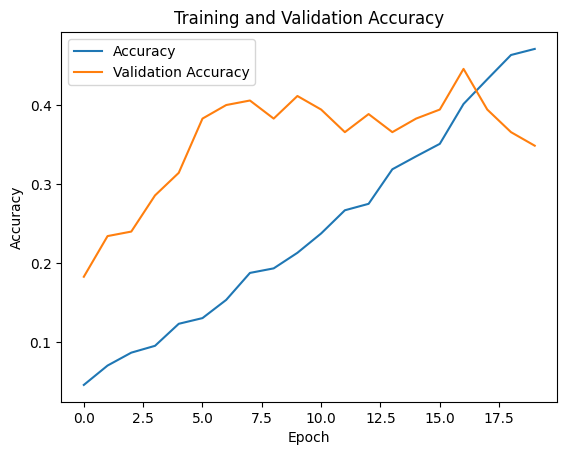

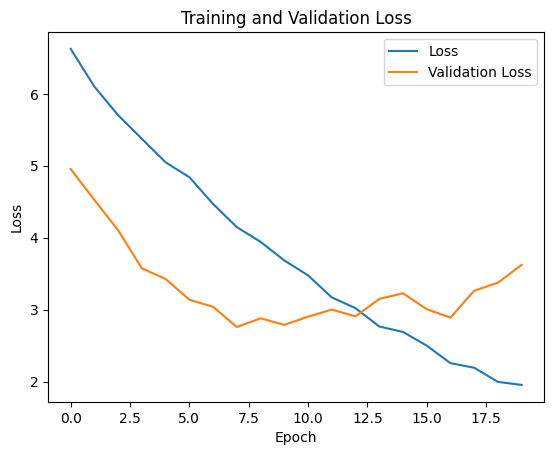

In [4]:
import matplotlib.pyplot as plt 

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

Found 2083 images belonging to 1000 classes.
Found 175 images belonging to 1000 classes.
Epoch 1/20


/home/gblack98/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


66/66 ━━━━━━━━━━━━━━━━━━━━ 111s 2s/step - accuracy: 0.0370 - loss: 6.7565 - val_accuracy: 0.1771 - val_loss: 4.5408
Epoch 2/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 110s 2s/step - accuracy: 0.0636 - loss: 6.0946 - val_accuracy: 0.2171 - val_loss: 4.1039
Epoch 3/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 105s 2s/step - accuracy: 0.0890 - loss: 5.6703 - val_accuracy: 0.2629 - val_loss: 3.7401
Epoch 4/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 113s 2s/step - accuracy: 0.1129 - loss: 5.3111 - val_accuracy: 0.3143 - val_loss: 3.2910
Epoch 5/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 134s 2s/step - accuracy: 0.1303 - loss: 4.9685 - val_accuracy: 0.3029 - val_loss: 3.3923
Epoch 6/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - accuracy: 0.1303 - loss: 4.7218 - val_accuracy: 0.3143 - val_loss: 3.2575
Epoch 7/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 126s 2s/step - accuracy: 0.1838 - loss: 4.3058 - val_accuracy: 0.4286 - val_loss: 2.9116
Epoch 8/20
66/66 ━━━━━━━━━━━━━━━━━━━━ 124s 2s/step - accuracy: 0.2365 - loss: 3.8621 - val_accuracy: 0.4000 - val_loss: 2.

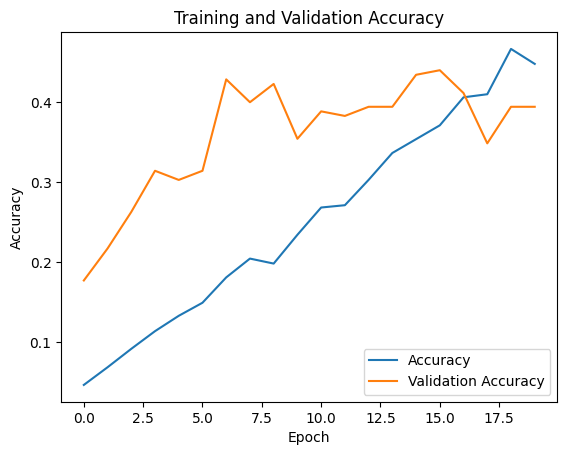

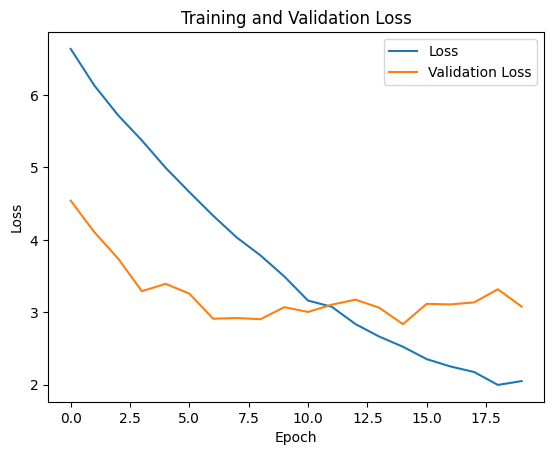

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input  # Importation de preprocess_input depuis resnet
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam


# Chemin des images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"
top_n_classes = 1000  # Nombre de classes à considérer
target_size = (224, 224)
batch_size = 32
epochs = 20

# Augmentation des données
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Générateurs pour les données d'entraînement et de validation
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    classes=os.listdir(images_dir)[:top_n_classes]
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    classes=os.listdir(images_dir)[:top_n_classes]
)

# Chargement du modèle pré-entraîné ResNet50
base_model = ResNet50(weights='imagenet', include_top=False)

# Extraction de caractéristiques et ajout de couches personnalisées
x = base_model.output
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(top_n_classes, activation='softmax')(x)

# Création du modèle final
model = Model(inputs=base_model.input, outputs=predictions)

# Gel des couches du modèle de base
for layer in base_model.layers:
    layer.trainable = False

# Compilation du modèle
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(train_generator, validation_data=validation_generator, epochs=epochs)

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


2024-04-16 10:23:21.928662: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-16 10:23:22.120074: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-16 10:23:22.906708: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Found 2083 images belonging to 1000 classes.
Found 175 images belonging to 1000 classes.
Epoch 1/50


/home/gblack98/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


66/66 ━━━━━━━━━━━━━━━━━━━━ 106s 2s/step - accuracy: 0.0163 - loss: 7.0998 - val_accuracy: 0.1371 - val_loss: 5.1808 - learning_rate: 1.0000e-04
Epoch 2/50
66/66 ━━━━━━━━━━━━━━━━━━━━ 105s 2s/step - accuracy: 0.0437 - loss: 6.3805 - val_accuracy: 0.1600 - val_loss: 4.6863 - learning_rate: 1.0000e-04
Epoch 3/50
66/66 ━━━━━━━━━━━━━━━━━━━━ 108s 2s/step - accuracy: 0.0475 - loss: 6.2066 - val_accuracy: 0.1771 - val_loss: 4.4761 - learning_rate: 1.0000e-04
Epoch 4/50
66/66 ━━━━━━━━━━━━━━━━━━━━ 109s 2s/step - accuracy: 0.0763 - loss: 5.9548 - val_accuracy: 0.2229 - val_loss: 4.1408 - learning_rate: 1.0000e-04
Epoch 5/50
66/66 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.0943 - loss: 5.7320 - val_accuracy: 0.2686 - val_loss: 3.9199 - learning_rate: 1.0000e-04
Epoch 6/50
66/66 ━━━━━━━━━━━━━━━━━━━━ 121s 2s/step - accuracy: 0.1074 - loss: 5.4640 - val_accuracy: 0.3029 - val_loss: 3.8057 - learning_rate: 1.0000e-04
Epoch 7/50
66/66 ━━━━━━━━━━━━━━━━━━━━ 122s 2s/step - accuracy: 0.1130 - loss: 5.2

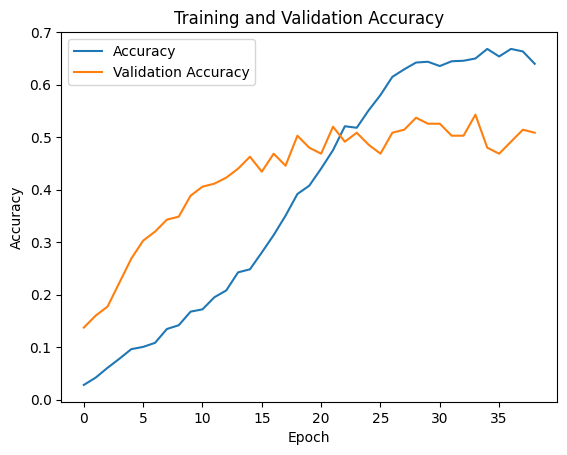

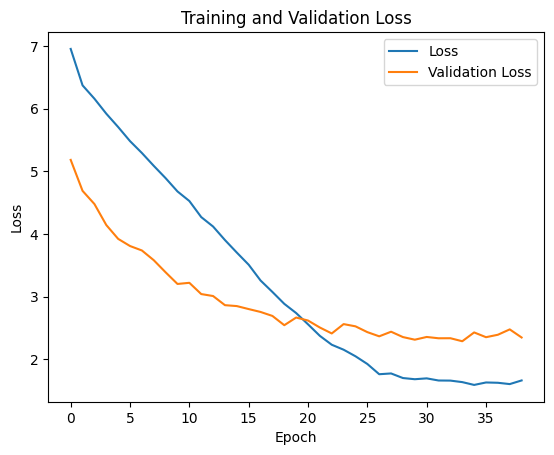

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Chemin des images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"
top_n_classes = 1000  # Nombre de classes à considérer
target_size = (224, 224)
batch_size = 32
epochs = 50

# Augmentation des données
datagen = ImageDataGenerator(
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Générateurs pour les données d'entraînement et de validation
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    classes=os.listdir(images_dir)[:top_n_classes]
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    classes=os.listdir(images_dir)[:top_n_classes]
)

# Chargement du modèle pré-entraîné ResNet50
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Extraction de caractéristiques et ajout de couches personnalisées
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Dropout pour la régularisation
predictions = Dense(top_n_classes, activation='softmax')(x)

# Création du modèle final
model = Model(inputs=base_model.input, outputs=predictions)

# Gel des couches du modèle de base sauf les dernières
for layer in base_model.layers:
    layer.trainable = False

# Compilation du modèle avec un taux d'apprentissage réduit
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Définition des rappels pour la régularisation
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-6)

# Entraînement du modèle avec les rappels
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    callbacks=[early_stop, reduce_lr]
)

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


save_dir="/home/gblack98/CNN_Model/archiveGA"
model.save(os.path.join(save_dir, 'Model_de_face_recognition_Gblack98C.h5'))

In [5]:
save_dir="/home/gblack98/CNN_Model/archiveGA"
model.save(os.path.join(save_dir, 'Model_de_face_recognition_Gblack98C.h5'))

In [6]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, None,      │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, None,      │      9,472 │ conv1_pad[0][0]   │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, None,      │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, None,      │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, None,      │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, None,      │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, None,      │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, None,      │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, None,      │          0 │ conv2_block1_1_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, None,      │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, None,      │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, None,      │          0 │ conv2_block1_2_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, None,      │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, None,      │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, None,      │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, None,      │      1,024 │ conv2_block1_3_c

 Total params: 30,819,706 (117.57 MB)

 Trainable params: 2,410,664 (9.20 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

 Optimizer params: 4,821,330 (18.39 MB)

In [3]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import StratifiedKFold

# Chemin des images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"
top_n_classes = 1000  # Nombre de classes à considérer
target_size = (224, 224)
batch_size = 64
epochs = 50
dropout_rate = 0.5
l2_regularization = 0.001
learning_rate = 0.0001

# Augmentation des données
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Générateurs pour les données d'entraînement et de validation
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    classes=os.listdir(images_dir)[:top_n_classes]
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    classes=os.listdir(images_dir)[:top_n_classes]
)

# Chargement du modèle pré-entraîné ResNet50
base_model = ResNet50(weights='imagenet', include_top=False)

# Extraction de caractéristiques et ajout de couches personnalisées
x = base_model.output
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(l2_regularization))(x)
x = Dropout(dropout_rate)(x)
predictions = Dense(top_n_classes, activation='softmax')(x)

# Création du modèle final
model = Model(inputs=base_model.input, outputs=predictions)

# Gel des couches du modèle de base
for layer in base_model.layers:
    layer.trainable = False

# Compilation du modèle
optimizer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(train_generator, validation_data=validation_generator, epochs=epochs)

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

save_dir="/home/gblack98/CNN_Model/archiveGA"
model.save(os.path.join(save_dir, 'Model_de_face_recognition_Gblack98B.h5'))

2024-04-16 18:26:44.231230: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-16 18:26:44.439664: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-16 18:26:45.416342: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


KeyboardInterrupt: 

Found 2083 images belonging to 1000 classes.
Found 175 images belonging to 1000 classes.
Epoch 1/50


/home/gblack98/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


33/33 ━━━━━━━━━━━━━━━━━━━━ 115s 3s/step - accuracy: 0.0156 - loss: 7.1592 - val_accuracy: 0.1200 - val_loss: 6.1971
Epoch 2/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 135s 4s/step - accuracy: 0.0390 - loss: 6.8434 - val_accuracy: 0.1200 - val_loss: 5.3838
Epoch 3/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 137s 4s/step - accuracy: 0.0510 - loss: 6.5680 - val_accuracy: 0.1600 - val_loss: 5.0495
Epoch 4/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 158s 5s/step - accuracy: 0.0535 - loss: 6.5062 - val_accuracy: 0.1886 - val_loss: 4.7022
Epoch 5/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 161s 5s/step - accuracy: 0.0570 - loss: 6.4199 - val_accuracy: 0.2229 - val_loss: 4.6717
Epoch 6/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 159s 5s/step - accuracy: 0.0699 - loss: 6.2626 - val_accuracy: 0.2286 - val_loss: 4.4286
Epoch 7/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 155s 5s/step - accuracy: 0.0800 - loss: 6.0964 - val_accuracy: 0.2629 - val_loss: 4.2801
Epoch 8/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 158s 5s/step - accuracy: 0.0932 - loss: 5.9973 - val_accuracy: 0.2800 - val_loss: 4.

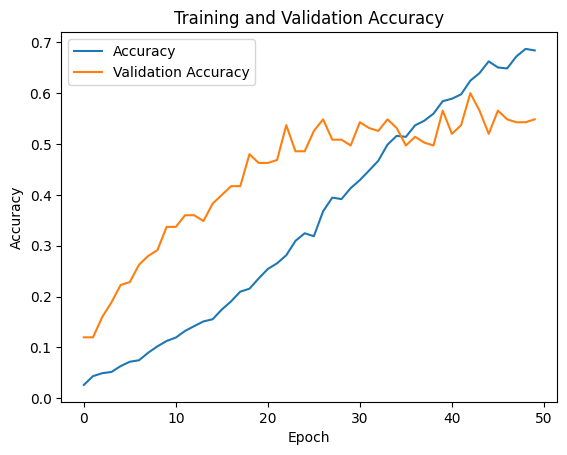

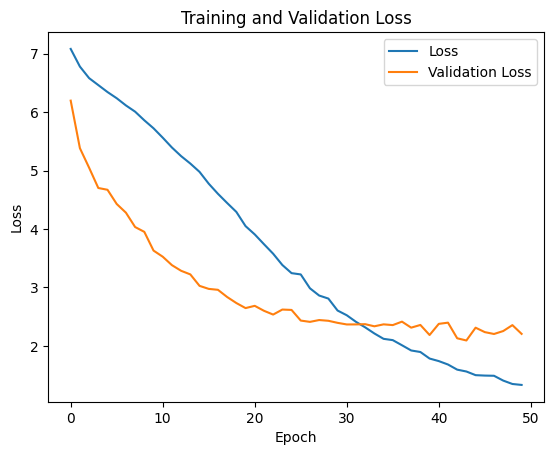

In [4]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

# Chemin des images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"
top_n_classes = 1000  # Nombre de classes à considérer
target_size = (224, 224)
batch_size = 64
epochs = 50
dropout_rate = 0.5
l2_regularization = 0.001
learning_rate = 0.0001

# Augmentation des données
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Générateurs pour les données d'entraînement et de validation
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    classes=os.listdir(images_dir)[:top_n_classes]
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    classes=os.listdir(images_dir)[:top_n_classes]
)

# Chargement du modèle pré-entraîné ResNet50
base_model = ResNet50(weights='imagenet', include_top=False)

# Extraction de caractéristiques et ajout de couches personnalisées
x = base_model.output
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(l2_regularization))(x)
x = Dropout(dropout_rate)(x)
predictions = Dense(top_n_classes, activation='softmax')(x)

# Création du modèle final
model = Model(inputs=base_model.input, outputs=predictions)

# Gel des couches du modèle de base
for layer in base_model.layers:
    layer.trainable = False

# Compilation du modèle
optimizer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(train_generator, validation_data=validation_generator, epochs=epochs)

# Affichage des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

save_dir="/home/gblack98/CNN_Model/archiveGA"
model.save(os.path.join(save_dir, 'Model_de_face_recognition_Gblack98A.h5'))

In [2]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

# Chemin des images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"
top_n_classes = 1000  # Nombre de classes à considérer
target_size = (224, 224)
batch_size = 64
epochs = 50
dropout_rate = 0.5
l2_regularization = 0.001
learning_rate = 0.0001

# Augmentation des données
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Générateurs pour les données d'entraînement et de validation
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    classes=os.listdir(images_dir)[:top_n_classes]
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    classes=os.listdir(images_dir)[:top_n_classes]
)

# Obtenez le dictionnaire de mapping des noms de classes aux indices
class_to_index = train_generator.class_indices

# Inversez le dictionnaire pour obtenir le mapping des indices aux noms de classes
index_to_class = {v: k for k, v in class_to_index.items()}

# Affichez les noms des personnes dans les données d'entraînement et de test
print("Noms des personnes dans les données d'entraînement :")
for index in range(len(index_to_class)):
    print(index, ":", index_to_class[index])

# Vous pouvez également enregistrer ces noms dans une liste
person_names = [index_to_class[index] for index in range(len(index_to_class))]


2024-04-17 12:30:20.773753: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-17 12:30:20.806315: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-17 12:30:21.544100: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Found 2083 images belonging to 1000 classes.
Found 175 images belonging to 1000 classes.
Noms des personnes dans les données d'entraînement :
0 : Adrianna_Zuzic
1 : Robert_Douglas
2 : Nancy_Demme
3 : Bernard_Lord
4 : Sammy_Sosa
5 : Roland_Koch
6 : Mark_Andrew
7 : Brian_Schneider
8 : Sergei_Yastrzhembsky
9 : Colin_Montgomerie
10 : Alberto_Fujimori
11 : Thierry_Mariani
12 : Raul_Chacon
13 : Sergio_Castellitto
14 : Janice_Abreu
15 : Charles_Rogers
16 : Jewel_Howard-Taylor
17 : Khin_Nyunt
18 : Brian_Pavlich
19 : Jean-Luc_Bideau
20 : Agnes_Bruckner
21 : Bill_Doba
22 : Solomon_Passy
23 : Patsy_Hardy
24 : Niall_Connolly
25 : Hootie_Johnson
26 : Tracee_Treadwell
27 : Khalid_Qazi
28 : Paul_Ebert
29 : Arnold_Palmer
30 : Aly_Wagner
31 : Matt_Anderson
32 : Aaron_Patterson
33 : Piotr_Anderszewski
34 : Dwayne_Williams
35 : Hamzah_Haz
36 : Norah_Jones
37 : Dustan_Mohr
38 : Ivan_Shvedoff
39 : Natalie_Coughlin
40 : Aretha_Franklin
41 : Vitali_Klitschko
42 : Leslie_Caldwell
43 : William_Macy
44 : Mathia

In [4]:
import os
from collections import defaultdict

# Chemin des images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Compter le nombre d'images par personne
image_counts = defaultdict(int)
for person in os.listdir(images_dir):
    person_dir = os.path.join(images_dir, person)
    if os.path.isdir(person_dir):
        image_counts[person] = len(os.listdir(person_dir))

# Sélectionner les noms des mille personnes avec le plus grand nombre d'images
top_n_persons = sorted(image_counts, key=image_counts.get, reverse=True)[:1000]

# Affichage des noms des mille personnes avec le plus grand nombre d'images
print("Noms des mille personnes avec le plus grand nombre d'images :")
for index, person in enumerate(top_n_persons):
    print(index, ":", person)


Noms des mille personnes avec le plus grand nombre d'images :
0 : George_W_Bush
1 : Colin_Powell
2 : Tony_Blair
3 : Donald_Rumsfeld
4 : Gerhard_Schroeder
5 : Ariel_Sharon
6 : Hugo_Chavez
7 : Junichiro_Koizumi
8 : Jean_Chretien
9 : John_Ashcroft
10 : Jacques_Chirac
11 : Serena_Williams
12 : Vladimir_Putin
13 : Luiz_Inacio_Lula_da_Silva
14 : Gloria_Macapagal_Arroyo
15 : Jennifer_Capriati
16 : Arnold_Schwarzenegger
17 : Lleyton_Hewitt
18 : Laura_Bush
19 : Hans_Blix
20 : Alejandro_Toledo
21 : Nestor_Kirchner
22 : Andre_Agassi
23 : Alvaro_Uribe
24 : Megawati_Sukarnoputri
25 : Tom_Ridge
26 : Silvio_Berlusconi
27 : Roh_Moo-hyun
28 : Vicente_Fox
29 : Kofi_Annan
30 : John_Negroponte
31 : David_Beckham
32 : Recep_Tayyip_Erdogan
33 : Guillermo_Coria
34 : Mahmoud_Abbas
35 : Bill_Clinton
36 : Juan_Carlos_Ferrero
37 : Jack_Straw
38 : Ricardo_Lagos
39 : Rudolph_Giuliani
40 : Gray_Davis
41 : Tom_Daschle
42 : Atal_Bihari_Vajpayee
43 : Jeremy_Greenstock
44 : Winona_Ryder
45 : Tiger_Woods
46 : Jose_Maria

2024-04-17 13:24:01.287711: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-17 13:24:01.756193: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-17 13:24:03.102682: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Found 6742 images belonging to 1000 classes.
Found 1075 images belonging to 1000 classes.
Epoch 1/50


/home/gblack98/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


106/106 ━━━━━━━━━━━━━━━━━━━━ 331s 3s/step - accuracy: 0.0332 - loss: 7.0269 - val_accuracy: 0.0986 - val_loss: 5.8657
Epoch 2/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 322s 3s/step - accuracy: 0.0680 - loss: 6.3888 - val_accuracy: 0.1144 - val_loss: 5.5761
Epoch 3/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 321s 3s/step - accuracy: 0.0826 - loss: 6.1806 - val_accuracy: 0.1526 - val_loss: 5.2016
Epoch 4/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 329s 3s/step - accuracy: 0.1003 - loss: 5.8852 - val_accuracy: 0.1833 - val_loss: 4.9006
Epoch 5/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 326s 3s/step - accuracy: 0.1162 - loss: 5.6780 - val_accuracy: 0.2214 - val_loss: 4.6012
Epoch 6/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 324s 3s/step - accuracy: 0.1454 - loss: 5.3004 - val_accuracy: 0.2326 - val_loss: 4.2873
Epoch 7/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 328s 3s/step - accuracy: 0.1456 - loss: 5.1140 - val_accuracy: 0.2605 - val_loss: 4.0782
Epoch 8/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 329s 3s/step - accuracy: 0.1624 - loss: 4.9032 - val_accuracy: 0.292

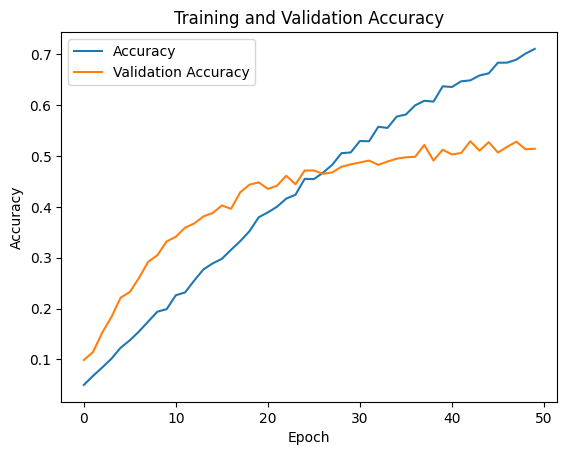

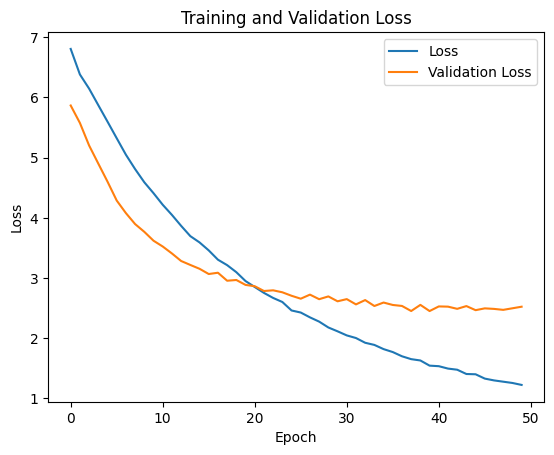

17/17 ━━━━━━━━━━━━━━━━━━━━ 57s 3s/step
Performance sur les classes sélectionnées :
                   precision    recall  f1-score   support

    George_W_Bush       0.10      0.11      0.11       106
     Colin_Powell       0.04      0.04      0.04        47
       Tony_Blair       0.03      0.04      0.03        28
  Donald_Rumsfeld       0.00      0.00      0.00        24
Gerhard_Schroeder       0.00      0.00      0.00        21
     Ariel_Sharon       0.00      0.00      0.00        15
      Hugo_Chavez       0.09      0.07      0.08        14
Junichiro_Koizumi       0.00      0.00      0.00        12
    Jean_Chretien       0.00      0.00      0.00        11
    John_Ashcroft       0.00      0.00      0.00        10

        micro avg       0.05      0.06      0.05       288
        macro avg       0.03      0.03      0.03       288
     weighted avg       0.05      0.06      0.05       288



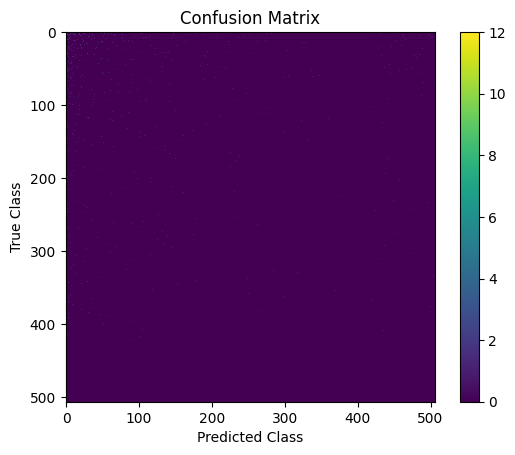

In [1]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix

# Chemin des images
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"
target_size = (224, 224)
batch_size = 64
epochs = 50
dropout_rate = 0.5
l2_regularization = 0.001
learning_rate = 0.0001

# Compter le nombre d'images par personne
image_counts = {}
for person in os.listdir(images_dir):
    person_dir = os.path.join(images_dir, person)
    if os.path.isdir(person_dir):
        image_counts[person] = len(os.listdir(person_dir))

# Sélectionner les noms des mille personnes avec le plus grand nombre d'images
top_1000_persons = sorted(image_counts, key=image_counts.get, reverse=True)[:1000]

# Liste des classes à utiliser pour l'entraînement et la validation
classes_to_use = top_1000_persons

# Augmentation des données
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Générateurs pour les données d'entraînement et de validation
train_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    classes=classes_to_use
)

validation_generator = datagen.flow_from_directory(
    images_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    classes=classes_to_use
)

# Chargement du modèle pré-entraîné ResNet50
base_model = ResNet50(weights='imagenet', include_top=False)

# Extraction de caractéristiques et ajout de couches personnalisées
x = base_model.output
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2))(x)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(l2_regularization))(x)
x = Dropout(dropout_rate)(x)
predictions = Dense(len(classes_to_use), activation='softmax')(x)

# Création du modèle final
model = Model(inputs=base_model.input, outputs=predictions)

# Gel des couches du modèle de base
for layer in base_model.layers:
    layer.trainable = False

# Compilation du modèle
optimizer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Entraînement du modèle
history = model.fit(train_generator, validation_data=validation_generator, epochs=epochs)

# Visualisation des résultats de l'entraînement
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Prédiction sur les données de validation
Y_pred = model.predict(validation_generator)
y_pred = np.argmax(Y_pred, axis=1)

# Noms des classes (personnes)
class_names = list(validation_generator.class_indices.keys())

# Sélection des classes les plus représentées pour l'évaluation
classes_to_evaluate = top_1000_persons[:10]

# Indices des classes sélectionnées
class_indices = [class_names.index(person) for person in classes_to_evaluate]

# Évaluation des performances sur les classes sélectionnées
print("Performance sur les classes sélectionnées :")
print(classification_report(validation_generator.classes, y_pred, labels=class_indices, target_names=classes_to_evaluate))

# Matrice de confusion
conf_matrix = confusion_matrix(validation_generator.classes, y_pred)
plt.imshow(conf_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.show()


In [2]:
save_dir="/home/gblack98/CNN_Model/archiveGA"
model.save(os.path.join(save_dir, 'Model_de_face_recognition_Gblack98AAA.h5'))

In [3]:
# Évaluation du modèle sur les données d'entraînement
train_loss, train_accuracy = model.evaluate(train_generator)

print("Perte sur les données d'entraînement :", train_loss)
print("Précision sur les données d'entraînement :", train_accuracy)


106/106 ━━━━━━━━━━━━━━━━━━━━ 317s 3s/step - accuracy: 0.8676 - loss: 0.7238
Perte sur les données d'entraînement : 0.737114667892456
Précision sur les données d'entraînement : 0.8593888878822327


In [29]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet import preprocess_input
import numpy as np
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import matplotlib.pyplot as plt

# Chemin de l'image de la personne ayant le plus grand nombre d'images
image_path = "/home/gblack98/CNN_Model/archiveGA/Colin_Powell.jpg"  # Remplacez cela par le chemin de l'image
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"
# Compter le nombre d'images par personne
image_counts = {}
for person in os.listdir(images_dir):
    person_dir = os.path.join(images_dir, person)
    if os.path.isdir(person_dir):
        image_counts[person] = len(os.listdir(person_dir))

# Sélectionner les noms des mille personnes avec le plus grand nombre d'images
top_1000_persons = sorted(image_counts, key=image_counts.get, reverse=True)[:1000]

# Liste des classes à utiliser pour l'entraînement et la validation
classes_to_use = top_1000_persons


# Charger le modèle
model_path = "/home/gblack98/CNN_Model/archiveGA/Model_de_face_recognition_Gblack98AAA.h5"  # Remplacez cela par le chemin de votre modèle
model = load_model(model_path)


# Charger et prétraiter l'image
img = image.load_img(image_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)  # Ajouter une dimension pour le batch

# Faire une prédiction avec le modèle
prediction = model.predict(img_array)
predicted_class_index = np.argmax(prediction)
predicted_class = classes_to_use[predicted_class_index]

print("La personne sur l'image est prédite comme :", predicted_class)



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step
La personne sur l'image est prédite comme : Colin_Powell


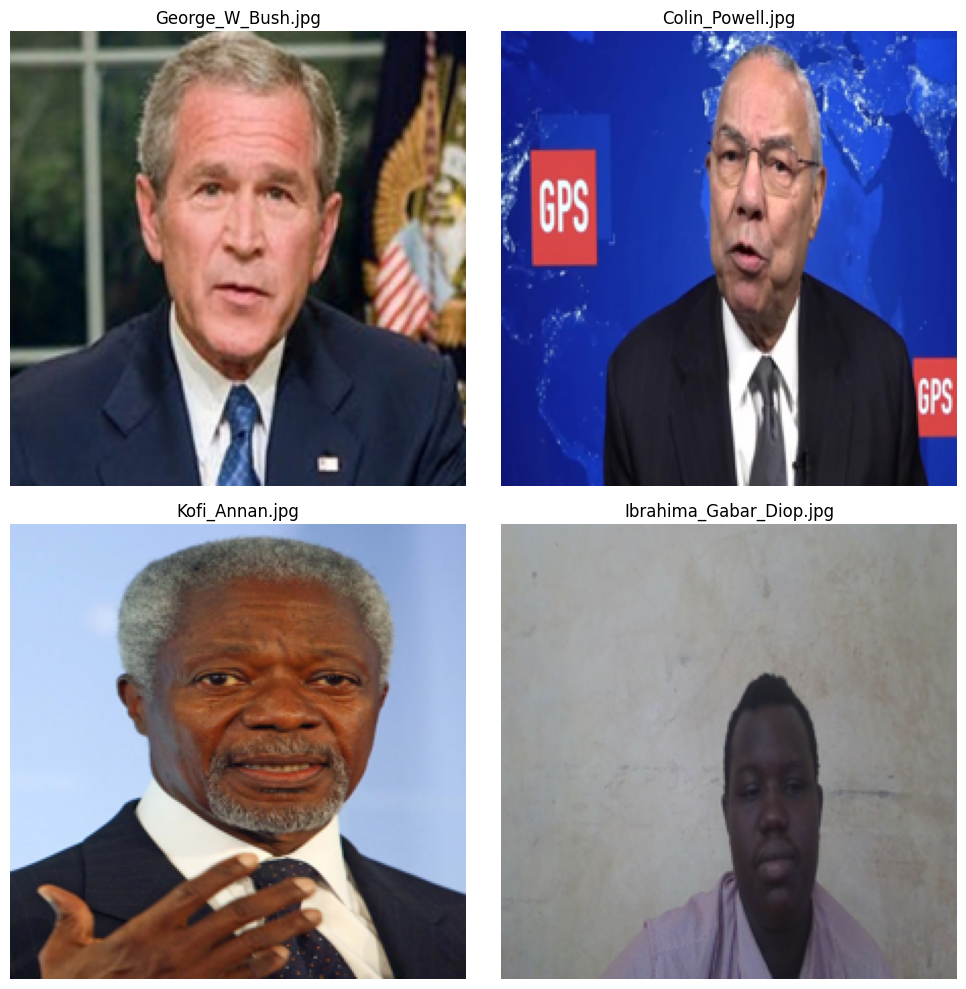

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image

# Chemin du dossier contenant les images
images_dir = "/home/gblack98/CNN_Model/archiveGA"

# Noms des fichiers d'images
image_files = ["George_W_Bush.jpg", "Colin_Powell.jpg", "Kofi_Annan.jpg", "Ibrahima_Gabar_Diop.jpg"]

# Taille cible pour le redimensionnement
target_size = (224, 224)

# Création de la grille de subplots
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Itérer sur chaque fichier d'image et l'afficher dans un subplot
for i, ax in enumerate(axes.flat):
    # Charger et redimensionner l'image
    img_path = os.path.join(images_dir, image_files[i])
    img = Image.open(img_path)
    img = img.resize(target_size)

    # Afficher l'image
    ax.imshow(img)
    ax.axis("off")  # Désactiver les axes

    # Utiliser le nom de l'image comme titre
    ax.set_title(image_files[i])

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher le tracé
plt.show()


In [ ]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet import preprocess_input
import numpy as np
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import matplotlib.pyplot as plt

# Chemin de l'image de la personne ayant le plus grand nombre d'images
image_path = "/home/gblack98/CNN_Model/archiveGA/Colin_Powell.jpg"  # Remplacez cela par le chemin de l'image
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"
# Compter le nombre d'images par personne
image_counts = {}
for person in os.listdir(images_dir):
    person_dir = os.path.join(images_dir, person)
    if os.path.isdir(person_dir):
        image_counts[person] = len(os.listdir(person_dir))

# Sélectionner les noms des mille personnes avec le plus grand nombre d'images
top_1000_persons = sorted(image_counts, key=image_counts.get, reverse=True)[:1000]

# Liste des classes à utiliser pour l'entraînement et la validation
classes_to_use = top_1000_persons


# Charger le modèle
model_path = "/home/gblack98/CNN_Model/archiveGA/Model_de_face_recognition_Gblack98AAA.h5"  # Remplacez cela par le chemin de votre modèle
model = load_model(model_path)


# Charger et prétraiter l'image
img = image.load_img(image_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)  # Ajouter une dimension pour le batch

# Faire une prédiction avec le modèle
prediction = model.predict(img_array)
predicted_class_index = np.argmax(prediction)
predicted_class = classes_to_use[predicted_class_index]

print("La personne sur l'image est prédite comme :", predicted_class)



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 709ms/step


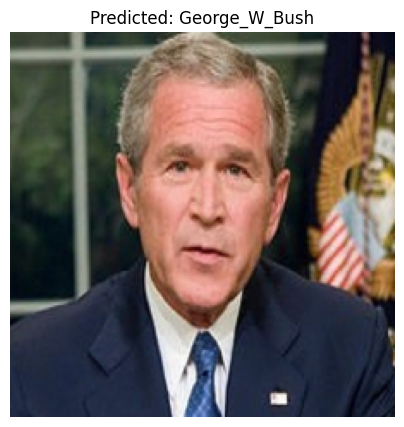

La personne sur l'image est prédite comme : George_W_Bush


In [40]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet import preprocess_input
import numpy as np
import os
import matplotlib.pyplot as plt

# Chemin de l'image de la personne à tester
image_path = "/home/gblack98/CNN_Model/archiveGA/George_W_Bush.jpg"  # Remplacez cela par le chemin de l'image
images_dir = "/home/gblack98/Images/python/travail_IGD/archive (1)/lfw-deepfunneled/lfw-deepfunneled"

# Charger le modèle
model_path = "/home/gblack98/CNN_Model/archiveGA/Model_de_face_recognition_Gblack98AAA.h5"
model = load_model(model_path)

# Compter le nombre d'images par personne
image_counts = {}
for person in os.listdir(images_dir):
    person_dir = os.path.join(images_dir, person)
    if os.path.isdir(person_dir):
        image_counts[person] = len(os.listdir(person_dir))

# Sélectionner les noms des mille personnes avec le plus grand nombre d'images
top_1000_persons = sorted(image_counts, key=image_counts.get, reverse=True)[:1000]

# Liste des classes à utiliser pour l'entraînement et la validation
classes_to_use = top_1000_persons

# Charger et prétraiter l'image
img = image.load_img(image_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = preprocess_input(img_array)
img_array = np.expand_dims(img_array, axis=0)  # Ajouter une dimension pour le batch

# Faire une prédiction avec le modèle
prediction = model.predict(img_array)
predicted_class_index = np.argmax(prediction)
predicted_class = classes_to_use[predicted_class_index]


# Trouver le nom de la personne prédite
if np.argmax(prediction) < len(classes_to_use):
    predicted_person = classes_to_use[np.argmax(prediction)]
else:
    predicted_person = "Unknown"

# Afficher l'image et la prédiction
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.title(f"Predicted: {predicted_person}")
plt.axis("off")
plt.show()

print("La personne sur l'image est prédite comme :", predicted_person)

